# Indigenous Funding Case Study

**Scenario:**  The allocation of public money (obtained from the public via taxes) is a politically sensitive activity with governments regularly coming under scrutiny for how this money is spent. A respected media organisation is looking into the Queensland Government's Advance Queensland program. The resulting story could be a "good news" story reporting on the success of the program, however if inappropriate spending or irregularities are found, it could become a story that is critical of the scheme, and potentially the Government.

**Project Structure:** This project is structured in two parts: Part A and Part B. Part A focuses on the analysis of the Queensland Government’s Advance Queensland program, specifically examining the distribution of funds across South-East Queensland and Regional Queensland over time, particularly during the COVID-19 recovery period. The goal was to identify trends and insights that could indicate the program’s effectiveness in supporting economic development and innovation. However, a limitation of Part A was the absence of more detailed data, which restricted the depth of insights, particularly in understanding the allocation of funds to specific groups, like Indigenous recipients.

To address this shortcoming and enhance the analysis, Part B extends the initial findings by incorporating additional data, specifically unstructured data from the Guardian API. Part B also introduces machine learning techniques to uncover more nuanced insights, particularly regarding the imbalance in funding between Indigenous and non-Indigenous recipients. This extended analysis allows for a deeper and more comprehensive understanding of the Advance Queensland program’s impact.


## Part A

In this part, the analysis focuses on the distribution of Advance Queensland program funds between South-East Queensland and Regional Queensland, particularly during and after the COVID-19 pandemic. The goal is to understand how the program's funding allocations contribute to economic development and innovation, especially in response to the economic challenges posed by COVID-19.

### Questions
How has the distribution of Advance Queensland program funds varied across South-East Queensland and Regional Queensland over time, and what insights does this offer into the program's contribution to economic development amidst the recovery from COVID-19, a period of economic downturn and recovery?

**Sub Questions:**
- Are there any noticeable trends in the distribution of Advance Queensland program funds between South-East Queensland and Regional Queensland during and after COVID-19?
- How does the program adapt its funding allocations to support economic resilience and innovation during times of economic uncertainty?
- How does this distribution of Advance Queensland funds align with the program's objective of fostering economic development and innovation?


### Data Loading

In [1]:
import pandas as pd

funding_df = pd.read_csv("advance-queensland-funding-recipients.csv", encoding='cp1252')
funding_df.head()

,Program,Round,Recipient Name,Physical Address of Recipient - Suburb/Location,Physical Address of Recipient - Post Code,University Collaborator (if applicable),Other Partners; Collaborators (if applicable),Investment/Project Title,Primary Location of Activity/Project - Suburb,Primary Location of Activity/Project - Post Code,Multiple Locations of Activity/Project (if applicable),Approval date,Local Government /Council,RAP Region,State Electorate,Actual Contractual Commitment ($)
0,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Central Queensland University,Norman Gardens,4701.0,NaN,BHP Billiton,Decolonising the systematic barriers and enabl...,Brisbane City,4001.0,NaN,14/06/2019,Rockhampton (R),Brisbane and Redlands,Keppel,107084
1,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Griffith University,Nathan,4111.0,NaN,NaN,An indigenous journey through the 21st century...,Nathan,4111.0,NaN,28/01/2016,Brisbane (C),Brisbane and Redlands,Toohey,117500
2,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,Queensland University of Technology,Brisbane City,4000.0,NaN,Engineered Wood Products Association Australa...,An Innovative Framing System for Taller Timber...,Brisbane City,4000.0,NaN,21/08/2018,Brisbane (C),Brisbane and Redlands,McConnel,240000
3,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,CSIRO,Smithfield,4878.0,NaN,CSIRO,Transforming hidden data: An integrative infor...,Smithfield,4878.0,NaN,28/01/2016,Cairns (R),Far North Queensland,Barron River,158032
4,Advancing Regional Innovation Program,AQ Advancing Regional Innovation Full 2016-17,Redland City Council,Cleveland,4163.0,NaN,Community Information Support Services Ltd \n...,Growing innovation in the Redlands and Logan r...,Cleveland,4163.0,"Meadowbrook, Alexandra Hills, Springwood",21/09/2017,Redland (C),Brisbane and Redlands,Oodgeroo,500000


### Data Clenaing and Transformation

In [2]:
print(funding_df.dtypes)

Program                                                    object
Round                                                      object
Recipient Name                                             object
Physical Address of Recipient - Suburb/Location            object
Physical Address of Recipient - Post Code                 float64
University Collaborator (if applicable)                    object
Other Partners; Collaborators (if applicable)              object
Investment/Project Title                                   object
Primary Location of Activity/Project - Suburb              object
Primary Location of Activity/Project - Post Code          float64
Multiple Locations of Activity/Project (if applicable)     object
Approval date                                              object
Local Government /Council                                  object
RAP Region                                                 object
State Electorate                                           object
Actual Con

#### Convert 'Approval date'

In [3]:
# Convert 'Approval date' to DateTime with dayfirst=True
funding_df["Approval date"] = pd.to_datetime(funding_df["Approval date"], dayfirst=True)

# Verify the changes
funding_df["Approval date"].head()

0   2019-06-14
1   2016-01-28
2   2018-08-21
3   2016-01-28
4   2017-09-21
Name: Approval date, dtype: datetime64[ns]

Filtering by the approval date is an important aspect in answering the proposed questions, as trends over time are trying to be identified. Therefore, it was important to ensure that the data in the column was converted from an object to datetime64[ns].

#### Convert 'Actual Contractual Commitment ($)'

In [4]:
#Convert Actual Contractual Commitment ($) to an int
funding_df['Actual Contractual Commitment ($)'] = funding_df['Actual Contractual Commitment ($)'].str.replace(',', '')
funding_df['Actual Contractual Commitment ($)'] = pd.to_numeric(funding_df['Actual Contractual Commitment ($)']).astype(int)

# Verify the changes
funding_df['Actual Contractual Commitment ($)'].head()

0    107084
1    117500
2    240000
3    158032
4    500000
Name: Actual Contractual Commitment ($), dtype: int32

The 'Actual Contractual Commitment ($)' column had numbers stored as strings due to commas. These needed to be removed and converted to integers for accurate calculations. This transformation was necessary to enable mathematical operations, such as comparing funding across regions.

#### Convert Post Code Columns

In [5]:
# Convert Post Code columns to a object - removing the .0 at the end
funding_df['Primary Location of Activity/Project - Post Code'] = funding_df['Primary Location of Activity/Project - Post Code'].astype(str).str.replace('.0', '')
funding_df['Physical Address of Recipient - Post Code'] = funding_df['Physical Address of Recipient - Post Code'].astype(str).str.replace('.0', '')

# Verify the changes
funding_df[['Primary Location of Activity/Project - Post Code', 'Physical Address of Recipient - Post Code']].head()

,Primary Location of Activity/Project - Post Code,Physical Address of Recipient - Post Code
0,4001,4701
1,4111,4111
2,4000,4000
3,4878,4878
4,4163,4163


The above code converts the two columns containing postcodes, "Primary Location of Activity/Project - Post Code" and "Physical Address of Recipient - Post Code", from a float to a string. Despite being numbers, postcodes should be strings, as you cannot perform mathematical operations on them.

#### Split Data into SEQ and Regional

In [6]:
funding_df['RAP Region'].unique()

array(['Brisbane and Redlands', 'Far North Queensland', 'Sunshine Coast',
       'Townsville', 'Wide Bay', 'Mackay-Whitsunday', 'Darling Downs',
       'Moreton Bay', 'Gold Coast', 'Central Queensland', 'Ipswich',
       'Outback Queensland', 'Brisbane', 'Statewide', 'Logan',
       'NonQueensland'], dtype=object)

In [7]:
southeast_qld = ['Brisbane and Redlands', 'Sunshine Coast', 'Moreton Bay', 'Gold Coast', 'Ipswich', 'Brisbane', 'Logan']
regional_qld = ['Far North Queensland', 'Townsville', 'Wide Bay', 'Mackay-Whitsunday', 'Darling Downs', 'Central Queensland', 'Outback Queensland']

The 'RAP Region' column was used to categorise the data into two lists: South-East Queensland (SEQ) and Regional Queensland. This distinction is key to analysing funding disparities between the two regions. The regions were defined based on the information from [SEQ Mayors](https://seqmayors.qld.gov.au/about-us/councils), which outlines the councils in SEQ.

The primary location of the project, as indicated by the 'RAP Region' column, was chosen for this categorisation. While other columns, such as 'Local Government /Council' and 'State Electorate', identify the recipient’s location, the project’s location offers a more accurate picture of the funding distribution.

To avoid skewing the analysis, "Statewide" and "NonQueensland" values were excluded. "Statewide" was excluded because it lacks specific regional breakdowns, potentially inflating counts, while "NonQueensland" was removed to maintain focus on Queensland regions.

#### Add New Column "Region"

In [8]:
se_qld_condition = funding_df['RAP Region'].isin(southeast_qld)
regional_qld_condition = funding_df['RAP Region'].isin(regional_qld)

funding_df.loc[se_qld_condition, 'Region'] = 'South-East Queensland'
funding_df.loc[regional_qld_condition, 'Region'] = 'Regional Queensland'

# Verify the changes
funding_df.head()

,Program,Round,Recipient Name,Physical Address of Recipient - Suburb/Location,Physical Address of Recipient - Post Code,University Collaborator (if applicable),Other Partners; Collaborators (if applicable),Investment/Project Title,Primary Location of Activity/Project - Suburb,Primary Location of Activity/Project - Post Code,Multiple Locations of Activity/Project (if applicable),Approval date,Local Government /Council,RAP Region,State Electorate,Actual Contractual Commitment ($),Region
0,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Central Queensland University,Norman Gardens,4701,NaN,BHP Billiton,Decolonising the systematic barriers and enabl...,Brisbane City,4001,NaN,2019-06-14,Rockhampton (R),Brisbane and Redlands,Keppel,107084,South-East Queensland
1,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Griffith University,Nathan,4111,NaN,NaN,An indigenous journey through the 21st century...,Nathan,4111,NaN,2016-01-28,Brisbane (C),Brisbane and Redlands,Toohey,117500,South-East Queensland
2,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,Queensland University of Technology,Brisbane City,4000,NaN,Engineered Wood Products Association Australa...,An Innovative Framing System for Taller Timber...,Brisbane City,4000,NaN,2018-08-21,Brisbane (C),Brisbane and Redlands,McConnel,240000,South-East Queensland
3,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,CSIRO,Smithfield,4878,NaN,CSIRO,Transforming hidden data: An integrative infor...,Smithfield,4878,NaN,2016-01-28,Cairns (R),Far North Queensland,Barron River,158032,Regional Queensland
4,Advancing Regional Innovation Program,AQ Advancing Regional Innovation Full 2016-17,Redland City Council,Cleveland,4163,NaN,Community Information Support Services Ltd \n...,Growing innovation in the Redlands and Logan r...,Cleveland,4163,"Meadowbrook, Alexandra Hills, Springwood",2017-09-21,Redland (C),Brisbane and Redlands,Oodgeroo,500000,South-East Queensland


The 'Region' column was added to categorise projects into South-East and Regional Queensland. This distinction simplifies the analysis and visualisation of funding distribution, providing a clearer picture of how funds are allocated across the two regions.

#### Add Year, Quarter and Month Columns

In [9]:
funding_df['Year'] = funding_df['Approval date'].dt.year
funding_df['Quarter'] = funding_df['Approval date'].dt.quarter
funding_df['Month'] = funding_df['Approval date'].dt.month
funding_df.head()

,Program,Round,Recipient Name,Physical Address of Recipient - Suburb/Location,Physical Address of Recipient - Post Code,University Collaborator (if applicable),Other Partners; Collaborators (if applicable),Investment/Project Title,Primary Location of Activity/Project - Suburb,Primary Location of Activity/Project - Post Code,Multiple Locations of Activity/Project (if applicable),Approval date,Local Government /Council,RAP Region,State Electorate,Actual Contractual Commitment ($),Region,Year,Quarter,Month
0,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Central Queensland University,Norman Gardens,4701,NaN,BHP Billiton,Decolonising the systematic barriers and enabl...,Brisbane City,4001,NaN,2019-06-14,Rockhampton (R),Brisbane and Redlands,Keppel,107084,South-East Queensland,2019,2,6
1,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Griffith University,Nathan,4111,NaN,NaN,An indigenous journey through the 21st century...,Nathan,4111,NaN,2016-01-28,Brisbane (C),Brisbane and Redlands,Toohey,117500,South-East Queensland,2016,1,1
2,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,Queensland University of Technology,Brisbane City,4000,NaN,Engineered Wood Products Association Australa...,An Innovative Framing System for Taller Timber...,Brisbane City,4000,NaN,2018-08-21,Brisbane (C),Brisbane and Redlands,McConnel,240000,South-East Queensland,2018,3,8
3,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,CSIRO,Smithfield,4878,NaN,CSIRO,Transforming hidden data: An integrative infor...,Smithfield,4878,NaN,2016-01-28,Cairns (R),Far North Queensland,Barron River,158032,Regional Queensland,2016,1,1
4,Advancing Regional Innovation Program,AQ Advancing Regional Innovation Full 2016-17,Redland City Council,Cleveland,4163,NaN,Community Information Support Services Ltd \n...,Growing innovation in the Redlands and Logan r...,Cleveland,4163,"Meadowbrook, Alexandra Hills, Springwood",2017-09-21,Redland (C),Brisbane and Redlands,Oodgeroo,500000,South-East Queensland,2017,3,9


The 'Year', 'Quarter', and 'Month' columns were added to provide greater temporal granularity in the analysis. This allows for more detailed insights into the funding distribution over time, helping to identify long-term trends, seasonal variations, and the impact of the COVID-19 pandemic on funding allocations. 

- **Year** allows for a broad analysis of funding patterns, the ability to track yearly and identify long-term patterns.
- **Quarter** provides additional granularity for the analysis and the ability to identify seasonal trends, or the variation of funding allocation over shorter time intervals.
- **Month** offers the highest level of granularity, making it possible to pinpoint specific monthly trends, especially during key periods such as the COVID-19 recovery phase.

### Analysis

#### Funding Distribution Count by RAP Region
The following code calculates the total funding count for each RAP Region, grouped by South-East Queensland and Regional Queensland.

In [10]:
southeast_qld_df = funding_df[funding_df['RAP Region'].isin(southeast_qld)]
southeast_qld_counts = southeast_qld_df['RAP Region'].value_counts()
print("Count for South-East Queensland:")
print(southeast_qld_counts)
print("\nTotal Count for South-East Queensland:", southeast_qld_counts.sum())

regional_qld_df = funding_df[funding_df['RAP Region'].isin(regional_qld)]
regional_qld_counts = regional_qld_df['RAP Region'].value_counts()
print("\n\nCount for Regional Queensland:")
print(regional_qld_counts)
print("\nTotal Count for Regional Queensland:", regional_qld_counts.sum())

Count for South-East Queensland:
RAP Region
Brisbane and Redlands    590
Brisbane                 145
Gold Coast               105
Sunshine Coast            91
Ipswich                   47
Logan                     24
Moreton Bay               21
Name: count, dtype: int64

Total Count for South-East Queensland: 1023


Count for Regional Queensland:
RAP Region
Far North Queensland    75
Townsville              53
Darling Downs           45
Central Queensland      37
Wide Bay                29
Mackay-Whitsunday       18
Outback Queensland      12
Name: count, dtype: int64

Total Count for Regional Queensland: 269


#### Funding Mean by RAP Region
The following code calculates the mean "Actual Contractual Commitment ($)" for each RAP Region.

In [11]:
southeast_qld_df = funding_df[funding_df['RAP Region'].isin(southeast_qld)]
southeast_qld_means = southeast_qld_df.groupby('RAP Region')['Actual Contractual Commitment ($)'].mean().round(2)
print("Means for South-East Queensland:")
print(southeast_qld_means)
print("\nMean for South-East Queensland:", southeast_qld_means.mean().round(2))

regional_qld_df = funding_df[funding_df['RAP Region'].isin(regional_qld)]
regional_qld_means = regional_qld_df.groupby('RAP Region')['Actual Contractual Commitment ($)'].mean().round(2)
print("\n\nMeans for Regional Queensland:")
print(regional_qld_means)
print("\nMean for Regional Queensland:", regional_qld_means.mean().round(2))

Means for South-East Queensland:
RAP Region
Brisbane                 169536.98
Brisbane and Redlands    217214.37
Gold Coast               113202.89
Ipswich                  101883.70
Logan                     75151.00
Moreton Bay              107348.81
Sunshine Coast            90057.54
Name: Actual Contractual Commitment ($), dtype: float64

Mean for South-East Queensland: 124913.61


Means for Regional Queensland:
RAP Region
Central Queensland      195081.24
Darling Downs           197003.96
Far North Queensland     80248.65
Mackay-Whitsunday        78907.61
Outback Queensland      116496.83
Townsville              111764.38
Wide Bay                 77650.38
Name: Actual Contractual Commitment ($), dtype: float64

Mean for Regional Queensland: 122450.44


The analysis focused on funding distribution across SouthEast Queensland and Regional Queensland. The key findings include:

- **Funding Count**: South-East Queensland received significantly more projects (1023) compared to Regional Queensland (269), with Brisbane and Redlands being the highest in the South-East.
  
- **Funding Mean**: The average funding for South-East Queensland was slightly higher (\\$124,913.61) compared to Regional Queensland (\\$122,450.44). However, Brisbane and Redlands had the highest mean funding within the South-East, whereas areas like Far North Queensland received lower average funding.

These insights suggest that while South-East Queensland receives more funding, there may be disparities in the distribution of funds across regions. Further exploration of these insights is reccomended.


#### Descriptive Statistics 
##### Overview

In [12]:
funding_df.groupby('Region')['Actual Contractual Commitment ($)'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
Region,,,,,,,,
Regional Queensland,269.0,123031.62,284561.29,598.0,20000.0,50000.0,100000.0,3000000.0
South-East Queensland,1023.0,177582.95,565225.42,900.0,35000.0,100000.0,180000.0,10000000.0


The above code was used to provide a summary of the distribution of funds between the two regions: South-East Queensland and Regional Queensland. By calculating descriptive statistics, a snapshot of the distribution of funds for each region is provided. This is important to start with, as based on the results, further analysis can be conducted on areas of interest.

The column "'Actual Contractual Commitment ($)'" was specified as based on the field descriptions on the Queensland Government Open Data Portal it contains committed funding amounts and has been converted to a numeric data type

Based on the outputs, these are some notable insights that should be further analysed or discussed later:
- There are 269 funding recipients for Regional Queensland compared to 1023 for South-East Queensland. This highlights that Regional Queensland has fewer funding recipients. Additionally, the mean for South-East Queensland is higher, indicating that Regional Queensland is receiving fewer grants, and the grants it does receive are of less value than the South-East Queensland equivalents.
- South-East Queensland has a substantially higher standard deviation than Regional Queensland, indicating greater variability and/or dispersion in funding amounts. 
- Regional Queensland has lower minimum and maximum values. These values suggest that South-East Queensland is receiving a wider range of funding amounts, which are also higher than Regional Queensland's.

##### Yearly

In [13]:
yearly_mean = funding_df.groupby(['Year', 'Region'])['Actual Contractual Commitment ($)'].agg(['count', 'sum', 'mean']).round(2)
yearly_mean

count       sum       mean
Year Region                                           
2015 Regional Queensland        7    160724   22960.57
     South-East Queensland     45   6257737  139060.82
2016 Regional Queensland       54   4602945   85239.72
     South-East Queensland    260  40855478  157136.45
2017 Regional Queensland       90  11730628  130340.31
     South-East Queensland    317  46517447  146742.74
2018 Regional Queensland       34   2612161   76828.26
     South-East Queensland    116  29961072  258285.10
2019 Regional Queensland       26   4975652  191371.23
     South-East Queensland    113  18748019  165911.67
2020 Regional Queensland       22   5890948  267770.36
     South-East Queensland     90  28855591  320617.68
2021 Regional Queensland       20   1987666   99383.30
     South-East Queensland     39   6132435  157241.92
2022 Regional Queensland       14   1109781   79270.07
     South-East Queensland     41   4233082  103245.90
2023 Regional Queensland        2     25000   12500.00
     South-East Queensland      2    106500   53250.00

In [14]:
percent_change_year_df = funding_df.groupby(['Year', 'Region'])['Actual Contractual Commitment ($)'].sum().reset_index()
percent_change_year_df['Percentage Change'] = percent_change_year_df.groupby('Region')['Actual Contractual Commitment ($)'].pct_change() * 100
percent_change_year_df['Percentage Change'] = percent_change_year_df['Percentage Change'].round(2)
percent_change_year_df

,Year,Region,Actual Contractual Commitment ($),Percentage Change
0,2015,Regional Queensland,160724,NaN
1,2015,South-East Queensland,6257737,NaN
2,2016,Regional Queensland,4602945,2763.88
3,2016,South-East Queensland,40855478,552.88
4,2017,Regional Queensland,11730628,154.85
5,2017,South-East Queensland,46517447,13.86
6,2018,Regional Queensland,2612161,-77.73
7,2018,South-East Queensland,29961072,-35.59
8,2019,Regional Queensland,4975652,90.48
9,2019,South-East Queensland,18748019,-37.43


The above code was developed to summarise the count, total sum, and mean of the funding amount for each year. The output was split into the two regions to gain insight into how the funding allocation trends have developed over time.
 
Based on the outputs, these are some notable insights that should be further analysed or discussed later:
- Funding allocation peaked in 2017 and has shown a downward trend since.
- The sum and mean of funding allocation both increased between 2019 and 2020, potentially a response to the COVID-19 pandemic.  
- Regional Queensland consistently has lower funding counts, sum and mean than South-East Queensland.
- 2021 and onwards shows a downward trend.
 

##### Quarterly

In [15]:
quarterly_mean = funding_df.groupby(['Year', 'Quarter', 'Region'])['Actual Contractual Commitment ($)'].agg(['count', 'sum', 'mean']).round(2)
quarterly_mean

count       sum        mean
Year Quarter Region                                            
2015 3       South-East Queensland      1   4169000  4169000.00
     4       Regional Queensland        7    160724    22960.57
             South-East Queensland     44   2088737    47471.30
2016 1       Regional Queensland       15   1733440   115562.67
             South-East Queensland     98  12913934   131774.84
     2       Regional Queensland        4     76997    19249.25
             South-East Queensland     36   2611133    72531.47
     3       Regional Queensland       21   2327127   110815.57
             South-East Queensland     68  12728727   187187.16
     4       Regional Queensland       14    465381    33241.50
             South-East Queensland     58  12601684   217270.41
2017 1       Regional Queensland       28   3066926   109533.07
             South-East Queensland    125  18090052   144720.42
     2       Regional Queensland       24   2997605   124900.21
             South-East Queensland     45   5825154   129447.87
     3       Regional Queensland       29   5473902   188755.24
             South-East Queensland    137  22332914   163013.97
     4       Regional Queensland        9    192195    21355.00
             South-East Queensland     10    269327    26932.70
2018 1       Regional Queensland       10    161252    16125.20
             South-East Queensland     20   9734143   486707.15
     2       Regional Queensland        4    250000    62500.00
             South-East Queensland      9   6747583   749731.44
     3       Regional Queensland       19   2020909   106363.63
             South-East Queensland     62   7977645   128671.69
     4       Regional Queensland        1    180000   180000.00
             South-East Queensland     25   5501701   220068.04
2019 1       Regional Queensland        6    220000    36666.67
             South-East Queensland     17   3458855   203462.06
     2       Regional Queensland       10    583750    58375.00
             South-East Queensland     13   2246595   172815.00
     3       Regional Queensland        4    399462    99865.50
             South-East Queensland     49   6057671   123625.94
     4       Regional Queensland        6   3772440   628740.00
             South-East Queensland     34   6984898   205438.18
2020 1       Regional Queensland        3    475000   158333.33
             South-East Queensland      8   6474500   809312.50
     2       Regional Queensland        4    448858   112214.50
             South-East Queensland     18  12692895   705160.83
     3       Regional Queensland       12   4492090   374340.83
             South-East Queensland     34   6208593   182605.68
     4       Regional Queensland        3    475000   158333.33
             South-East Queensland     30   3479603   115986.77
2021 1       Regional Queensland        1     25108    25108.00
             South-East Queensland      1    157440   157440.00
     2       South-East Queensland      1     25000    25000.00
     3       Regional Queensland        2    120000    60000.00
             South-East Queensland      3     95000    31666.67
     4       Regional Queensland       17   1842558   108385.76
             South-East Queensland     34   5854995   172205.74
2022 1       Regional Queensland        2     72891    36445.50
             South-East Queensland      4    123636    30909.00
     2       Regional Queensland        6    691090   115181.67
             South-East Queensland      5    259076    51815.20
     3       South-East Queensland      3    195755    65251.67
     4       Regional Queensland        6    345800    57633.33
             South-East Queensland     29   3654615   126021.21
2023 1       Regional Queensland        2     25000    12500.00
             South-East Queensland      2    106500    53250.00

In [16]:
pd.set_option('display.max_columns', None)

In [17]:
percent_change_quarter_df = funding_df.groupby(['Year', 'Quarter', 'Region'])['Actual Contractual Commitment ($)'].sum().reset_index()
percent_change_quarter_df['Percentage Change'] = percent_change_quarter_df.groupby('Region')['Actual Contractual Commitment ($)'].pct_change() * 100
percent_change_quarter_df['Percentage Change'] = percent_change_quarter_df['Percentage Change'].round(2)
percent_change_quarter_df.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58
Year,2015,2015,2015,2016,2016,2016,2016,2016,2016,2016,2016,2017,2017,2017,2017,2017,2017,2017,2017,2018,2018,2018,2018,2018,2018,2018,2018,2019,2019,2019,2019,2019,2019,2019,2019,2020,2020,2020,2020,2020,2020,2020,2020,2021,2021,2021,2021,2021,2021,2021,2022,2022,2022,2022,2022,2022,2022,2023,2023
Quarter,3,4,4,1,1,2,2,3,3,4,4,1,1,2,2,3,3,4,4,1,1,2,2,3,3,4,4,1,1,2,2,3,3,4,4,1,1,2,2,3,3,4,4,1,1,2,3,3,4,4,1,1,2,2,3,4,4,1,1
Region,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland
Actual Contractual Commitment ($),4169000,160724,2088737,1733440,12913934,76997,2611133,2327127,12728727,465381,12601684,3066926,18090052,2997605,5825154,5473902,22332914,192195,269327,161252,9734143,250000,6747583,2020909,7977645,180000,5501701,220000,3458855,583750,2246595,399462,6057671,3772440,6984898,475000,6474500,448858,12692895,4492090,6208593,475000,3479603,25108,157440,25000,120000,95000,1842558,5854995,72891,123636,691090,259076,195755,345800,3654615,25000,106500
Percentage Change,NaN,NaN,-49.9,978.52,518.27,-95.56,-79.78,2922.36,387.48,-80.0,-1.0,559.01,43.55,-2.26,-67.8,82.61,283.39,-96.49,-98.79,-16.1,3514.25,55.04,-30.68,708.36,18.23,-91.09,-31.04,22.22,-37.13,165.34,-35.05,-31.57,169.64,844.38,15.31,-87.41,-7.31,-5.5,96.04,900.78,-51.09,-89.43,-43.96,-94.71,-95.48,-84.12,377.94,280.0,1435.46,6063.15,-96.04,-97.89,848.11,109.55,-24.44,-49.96,1766.93,-92.77,-97.09


Similarly to the code developed in the previous section, these two codes were used to find descriptive statistics about the funding amount for each region. However, to gain a deeper level of analysis, the column "Quarter" was used, allowing fora deeper understanding of funding trends, through seeing changes at a quarterly level.

Based on the outputs, these are some notable insights that should be further analysed or discussed later:
- During the peak of the COVID-19 pandemic in quarter 2 of 2020, there was a noticeable decrease in funding allocation across both regions.
- Throughout the COVID-19 pandemic, there have been continual disparities in funding allocations between the two regions, favouring South-East Queensland.

##### Monthly

In [18]:
filtered_df = funding_df[(funding_df['Year'] >= 2019) & (funding_df['Year'] <= 2022)]

In [19]:
monthly_mean = filtered_df.groupby(['Year', 'Quarter', 'Month', 'Region'])['Actual Contractual Commitment ($)'].agg(['count', 'sum', 'mean']).round(2)
monthly_mean

count       sum         mean
Year Quarter Month Region                                             
2019 1       1     Regional Queensland        6    220000     36666.67
                   South-East Queensland     15   1706000    113733.33
             2     South-East Queensland      1    300000    300000.00
             3     South-East Queensland      1   1452855   1452855.00
     2       4     South-East Queensland      1     99800     99800.00
             5     Regional Queensland       10    583750     58375.00
                   South-East Queensland     11   2039711    185428.27
             6     South-East Queensland      1    107084    107084.00
     3       8     Regional Queensland        4    399462     99865.50
                   South-East Queensland     49   6057671    123625.94
     4       10    South-East Queensland      2    375000    187500.00
             11    Regional Queensland        4    912440    228110.00
                   South-East Queensland     32   6609898    206559.31
             12    Regional Queensland        2   2860000   1430000.00
2020 1       1     South-East Queensland      1    450000    450000.00
             2     Regional Queensland        2    175000     87500.00
                   South-East Queensland      2    125000     62500.00
             3     Regional Queensland        1    300000    300000.00
                   South-East Queensland      5   5899500   1179900.00
     2       4     Regional Queensland        2    148858     74429.00
                   South-East Queensland      1  10000000  10000000.00
             5     Regional Queensland        2    300000    150000.00
                   South-East Queensland     13   1774000    136461.54
             6     South-East Queensland      4    918895    229723.75
     3       7     Regional Queensland        6   1116952    186158.67
                   South-East Queensland     30   5457157    181905.23
             8     South-East Queensland      2    105409     52704.50
             9     Regional Queensland        6   3375138    562523.00
                   South-East Queensland      2    646027    323013.50
     4       11    Regional Queensland        2    275000    137500.00
             12    Regional Queensland        1    200000    200000.00
                   South-East Queensland     30   3479603    115986.77
2021 1       2     South-East Queensland      1    157440    157440.00
             3     Regional Queensland        1     25108     25108.00
     2       5     South-East Queensland      1     25000     25000.00
     3       7     Regional Queensland        1     20000     20000.00
             8     Regional Queensland        1    100000    100000.00
                   South-East Queensland      2     65000     32500.00
             9     South-East Queensland      1     30000     30000.00
     4       10    Regional Queensland        8   1110000    138750.00
                   South-East Queensland     16   3995000    249687.50
             11    Regional Queensland        1       598       598.00
             12    Regional Queensland        8    731960     91495.00
                   South-East Queensland     18   1859995    103333.06
2022 1       1     South-East Queensland      1     30000     30000.00
             2     Regional Queensland        1     35391     35391.00
             3     Regional Queensland        1     37500     37500.00
                   South-East Queensland      3     93636     31212.00
     2       5     Regional Queensland        6    691090    115181.67
                   South-East Queensland      3    239076     79692.00
             6     South-East Queensland      2     20000     10000.00
     3       8     South-East Queensland      2     45755     22877.50
             9     South-East Queensland      1    150000    150000.00
     4       10    Regional Queensland        2    105800     52900.00
                   South-East Queensland      3    550000    18333

In [20]:
percent_change_month_df = filtered_df.groupby(['Year', 'Month', 'Region'])['Actual Contractual Commitment ($)'].sum().reset_index()
percent_change_month_df['Percentage Change'] = percent_change_month_df.groupby('Region')['Actual Contractual Commitment ($)'].pct_change() * 100
percent_change_month_df['Percentage Change'] = percent_change_month_df['Percentage Change'].round(2)
percent_change_month_df.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57
Year,2019,2019,2019,2019,2019,2019,2019,2019,2019,2019,2019,2019,2019,2019,2020,2020,2020,2020,2020,2020,2020,2020,2020,2020,2020,2020,2020,2020,2020,2020,2020,2020,2021,2021,2021,2021,2021,2021,2021,2021,2021,2021,2021,2021,2022,2022,2022,2022,2022,2022,2022,2022,2022,2022,2022,2022,2022,2022
Month,1,1,2,3,4,5,5,6,8,8,10,11,11,12,1,2,2,3,3,4,4,5,5,6,7,7,8,9,9,11,12,12,2,3,5,7,8,8,9,10,10,11,12,12,1,2,3,3,5,5,6,8,9,10,10,11,11,12
Region,Regional Queensland,South-East Queensland,South-East Queensland,South-East Queensland,South-East Queensland,Regional Queensland,South-East Queensland,South-East Queensland,Regional Queensland,South-East Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,South-East Queensland,Regional Queensland,South-East Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,Regional Queensland,South-East Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,Regional Queensland,South-East Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,Regional Queensland,South-East Queensland,South-East Queensland,Regional Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,South-East Queensland,South-East Queensland,South-East Queensland,Regional Queensland,South-East Queensland,Regional Queensland,South-East Queensland,South-East Queensland
Actual Contractual Commitment ($),220000,1706000,300000,1452855,99800,583750,2039711,107084,399462,6057671,375000,912440,6609898,2860000,450000,175000,125000,300000,5899500,148858,10000000,300000,1774000,918895,1116952,5457157,105409,3375138,646027,275000,200000,3479603,157440,25108,25000,20000,100000,65000,30000,1110000,3995000,598,731960,1859995,30000,35391,37500,93636,691090,239076,20000,45755,150000,105800,550000,240000,2864615,240000
Percentage Change,NaN,NaN,-82.42,384.28,-93.13,165.34,1943.8,-94.75,-31.57,5556.93,-93.81,128.42,1662.64,213.45,-93.19,-93.88,-72.22,71.43,4619.6,-50.38,69.51,101.53,-82.26,-48.2,272.32,493.88,-98.07,202.17,512.88,-91.85,-27.27,438.62,-95.48,-87.45,-84.12,-20.34,400.0,160.0,-53.85,1010.0,13216.67,-99.95,122301.34,-53.44,-98.39,-95.16,5.96,212.12,1742.91,155.32,-91.63,128.78,227.83,-84.69,266.67,126.84,420.84,-91.62


The analysis aimed to examine funding patterns on a monthly basis between 2019 and 2022 to understand how the COVID-19 pandemic influenced funding distribution. The years 2019 to 2022 were selected to provide a comprehensive view of the funding before, during, and after the pandemic's peak years.

Based on the outputs, these are some notable insights that should be further analysed or discussed later:
- Funding is not consistent throughout the year; some months are significantly higher than others.
- The only identified trend is that South-East Queensland receives a large amount of funds at the end of each year.
- In March, May, and July 2020, South-East Queensland had a large increase in funding.
- Regional Queensland and South-East Queensland both received significant funding in July 2020. However, South-East Queensland received \\$4,340,205 more.
- Regional Queensland and South-East Queensland both received significant funding in October 2021. However, South-East Queensland received an additional \\$2,885,000.

### Visualisation

#### Import Required Libraries

In [21]:
import plotly.express as px
import plotly.io as pio
pio.renderers.default = "iframe_connected"

#### Funding via Region

The two graphs below are used to get an initial visualisation of the funding distribution between South-East Queensland and Regional Queensland.

##### Pie Chart

In [22]:
fig1 = px.pie(funding_df, values='Actual Contractual Commitment ($)', names='Region', title='Funding Percentage by Region')
fig1.show()

The pie chart was used to visualise how funds have been distributed between South-East Queensland and Regional Queensland. The graph highlights that, from an initial look, South-East Queensland has a significantly larger portion of the funding from the Advance Queensland program. However, to provide detailed insights based on the chosen question more visualisations will need to be graphed, especially those showing the trends in funding over time.

##### Bar Chart (RAP Regions)

In [23]:
fig2 = px.bar(funding_df, x="RAP Region", y="Actual Contractual Commitment ($)", color='Region', title="Funding by RAP Region",
              height=500)
fig2.show()

The bar chart was used to visualise the funding amount for each RAP Region. This complemented the previous pie chart by offering a more detailed comparison of the value of contributions across regions. The chart clearly shows that South-East Queensland has received significantly more funding than Regional Queensland. It also highlights that South-East Queensland not only receives more grants but that those grants are of a higher value.

By using RAP Region as the x-axis, this bar chart offers valuable insights into which specific areas within both South-East Queensland and Regional Queensland are receiving the most funding. This visualisation allows for a clearer understanding of the funding distribution and provides a more granular look at the disparities between regions.

#### Funding via Region and Approval Date

Combining the below five visualisations offers diverse insight into the fund distribution over time across South-East Queensland and Regional Queensland.

##### Bar Chart

In [24]:
fig3 = px.bar(funding_df, x="Approval date", y="Actual Contractual Commitment ($)", color="Region")
fig3.update_layout(title="Funding Distribution by Region Over Time")
fig3.show()

A bar chart was chosen to represent the distribution of funds over time, where each bar corresponds to the total funding amount for a specific date. The bars are colour-coded by region to enhance clarity and make it easier for viewers to distinguish between South-East Queensland and Regional Queensland. This visualisation helps to identify patterns and fluctuations in funding across different periods.

By visualising the data this way, it's possible to observe the funding trends over time, including any noticeable spikes or declines in financial support for each region. This chart provides an overview of how funding was allocated over the years, which is helpful for further analysis and understanding of funding distribution.

##### Grouped Bar Chart

In [25]:
fig4 = px.bar(funding_df, x="Year", y="Actual Contractual Commitment ($)", color="Region", title='Funding Amounts Across Regions Over Time', barmode='group')
fig4.show()

This grouped bar chart was created to compare funding distribution across South-East Queensland and Regional Queensland over multiple years. The chart helps to identify any annual trends in funding and highlights how the distribution of funds has evolved between the two regions.

By grouping the bars based on "Year" and "Region", the chart effectively shows the total funding amount allocated to each region each year. The colour coding for "Region" allows for an easy comparison, making it clear which region received more funds in any given year. This visualisation offers a comprehensive view of how funding distribution has changed annually and how the regions have been impacted over time.

##### Scatter Plot by Approval Date

In [26]:
fig5 = px.scatter(funding_df, x="Approval date", y="Actual Contractual Commitment ($)", color="Region",  title='Funding Amounts Across Regions Over Time')
fig5.show()

The scatter plot was used to visualise how the funding amount has evolved over time, offering a clear view of trends and significant fluctuations. It helps identify key moments of change or large contributions that stand out as outliers.

Each point on the scatter plot represents the funding contribution for a specific approval date, with the colour of the points indicating the region. This format allows for a detailed view of the funding amounts across years, making it easy to track shifts and anomalies. Compared to the grouped bar chart, the scatter plot provides a different perspective, focusing on individual funding instances rather than grouped yearly totals.

##### Scatter Plot by Quarter

In [27]:
fig6 = px.scatter(funding_df, x="Approval date", y="Quarter", size="Actual Contractual Commitment ($)", 
                  color="Region", title='Funding Amounts Across Regions by Quarters')
fig6.show()

This scatter plot was chosen to visualise the funding amount by quarter, providing an analysis of quarterly variations in funding distribution across South-East Queensland and Regional Queensland. The size of each point corresponds to the "Actual Contractual Commitment ($)", making it easy to identify larger funding contributions.

The x-axis represents the "Approval date," and the y-axis is set to "Quarter." The colour is set to "Region," allowing viewers to distinguish between the different regions in the visualisation. This chart enables users to explore how the funding varies not only by quarter but also across regions, offering valuable insights into temporal and geographic trends.

##### Heatmap

In [28]:
heatmap_data = funding_df.pivot_table(index='Region', columns=['Year', 'Quarter'], values='Actual Contractual Commitment ($)', 
                                      aggfunc='sum')
quarters = [f"{year}-{quarter}" for year, quarter in heatmap_data.columns]
fig7 = px.imshow(heatmap_data, labels=dict(x='Year-Quarter', y='Region', color='Total Funding Amount ($)'), x=quarters, 
                 y=heatmap_data.index, title='Heatmap of Funding Amounts Over Time', height=800, width=1200)
fig7.show()

The heatmap provides a detailed overview of the funding contributions over time, comparing South-East Queensland and Regional Queensland. This visualisation was chosen because it effectively highlights patterns and trends in funding distribution across the regions, broken down by year and quarter.

The heatmap allows for an easy comparison of funding intensity by colour, where darker colours represent higher funding amounts. The rows represent the regions, while the columns correspond to the years and quarters. By observing the heatmap, viewers can identify periods with higher funding, as well as see if certain regions receive more consistent funding or if funding fluctuates over time.

This visualisation is useful for recognising cyclical patterns or funding surges, helping stakeholders better understand how funding allocation changes throughout the years and across different regions.

### Insights

#### Identified Insights
The above analysis of the Advance Queensland programs fund reveals several key insights into the distribution patterns between South-East Queensland and Regional Queensland, particularly how they have changed during and after the COVID-19 pandemic.

Firstly, regardless of COVID-19, South-East Queensland consistently receives the majority of the funding, indicating a disparity in resource allocation between the two regions. However, according to the 2021 Census, 74% of the Queensland population live in South-East Queensland, and the five largest statical area level 4's are all in South-East Queensland. Whilst the disproportionate funding may appear to highlight extreme regional inequalities, this is not the case. As per the visualised pie chart, South-East Queensland received 82.6% of funding; whilst this is not perfectly proportional to the population size, it highlights that the initial perception of extreme disparity is incorrect. Additionally, it should be noted that funding disparities between South-East Queensland and Regional Queensland are not solely reflective of population size; other factors, such as economic activity, infrastructure development, employment rate and innovation potential, are all likely to influence the proportion of the funds.

As seen in the five charts that visualise funding over time, from 2017, the distribution of funding has been on a downward trend; however, it did increase in 2020. From 2021 onwards, the downward trend continued; however, notably, the funding for Regional Queensland is falling slower than South-East Queensland. This suggests that as a response to the COVID-19 pandemic, the Queensland Government increased their funding to help support the Queensland economy during a period of economic downturn. However, once the economy was recovering, the Queensland government decreased its funding, continuing the trend that had started before the COVID-19 pandemic.

Furthermore, the analysis revealed that funding distribution is inconsistent throughout the year, with some months experiencing significantly higher funding amounts. This suggests that strategic timing or seasonal factors influence funding allocations. For example, South-East Queensland consistently receives a large amount of funds towards the end of each year, indicating potential budget cycles or project timelines. This also indicates that due to these factors, the Queensland Government may have been unable to continue with the additional support during the recovery phase, as they used the next year's budget to help in a time of need, 2020.

Overall, the insights developed from this analysis highlight that while the Advance Queensland program may appear to disproportionately allocate its funds, in terms of population, it is actually favourable to Regional Queensland in some instances, particularly during the COVID-19 pandemic and the recovery phase afterwards. 

#### Significance
These insights directly address the main question, sub-questions, and the scenario by providing a comprehensive understanding of the distribution patterns of Advance Queensland program funds between South-East Queensland and Regional Queensland over time, and particularly during and after the COVID-19 pandemic.

The insights recognise the disparity in funding allocation between South-East Queensland and Regional Queensland, highlighting that while South-East Queensland consistently receives the majority of funding, this does not necessarily indicate extreme regional inequalities. The insights provide a more nuanced understanding of the funding distribution by considering factors such as population size, economic activity, infrastructure development, and innovation potential.

The analysis highlights a notable increase in funding in 2020, likely a response to the COVID-19 pandemic to support the Queensland economy during a period of economic downturn. This addresses the sub-question of how the program adapts its funding allocations to support economic resilience and innovation during times of economic uncertainty, displaying a strategic shift in funding distribution. The downward trend in funding distribution since 2017, followed by an increase in 2020 and a subsequent decrease from 2021, offers key insights into the program's funding patterns and strategic decision-making.

Overall, the provided insights help understand the funding allocation of the Advance Queensland program and how it has helped contribute to economic growth amidst the recovery from the COVID-19 pandemic.

#### Shortcomings
The provided insights regarding the distribution of Advance Queensland program funds between South-East Queensland and Regional Queensland have a few notable shortcomings. Firstly, the insights were developed with a lack of contextual information. Without further knowledge about each region's projects, revenue sources, and socio-economic conditions, the insights provided will fail to provide a completely nuanced understanding of the distribution patterns over time. While some research has been completed to understand what factors may have affected the distribution of funds, significantly more will need to be completed to ensure the provided insights are clear. Additionally, no information was used to compare how the distribution of funds was affected by economic factors, such as Goss Domestic Profit, percentage of unemployment, inflation, interest and exchange rates.

#### Areas for Improvement
The data analytics cycle completed to answer the above questions can be improved through various means. Correlation modelling, segmentation analysis, and comparative analysis could significantly improve the quality of the analysis and, therefore, the provided insights. Correlation modelling could identify relationships between different variables and determine if they impact the distribution of funds. Segmentation analysis can be used to identify how funding is distributed across different categories, not just regions. Comparative analysis could be used in combination with other data sources to determine if regions are receiving proportionate funding in terms of their needs and population size. Also, an area for improvement is the inclusion of additional data sources, as identified above in the shortcomings.

## Part B

Building upon the analysis from Part A, Part B extends the investigation of the Queensland Government’s Advance Queensland program by incorporating additional unstructured data and applying machine learning techniques to gain deeper insights. While Part A provided a broad overview of funding distribution across regions and the impact of COVID-19, Part B aims to explore more nuanced trends, particularly focusing on the balance of funding allocation between Indigenous and non-Indigenous recipients. By integrating unstructured data from the Guardian API, this analysis will offer a broader perspective on the socio-economic factors influencing funding patterns

### Questions
Is there an imbalance in the distribution of Advance Queensland program funds between Indigenous and non-Indigenous recipients, and how does this impact the program's goal of achieving economic development and innovation through driving economic growth and creating jobs?

**Sub Questions:**
- If there is an imbalance, is the issue commonly discussed in Australian media?
- Have there been any noticeable trends in the distribution of Advance Queensland program funds between Indigenous and non-Indigenous recipients over time?
- Which regions receive the most funding for Indigenous programs, and does this align with the distribution of the Indigenous population in Queensland?

The research questions focus on understanding the distribution of funds within the Advance Queensland program, particularly with respect to Indigenous and non-Indigenous recipients. By addressing these questions, the goal is to identify whether there are any imbalances that could impact the program’s larger objectives of fostering economic growth, creating jobs, and driving innovation. The main question centers on whether an imbalance exists, and how it may affect the intended outcomes of the program. The sub-questions further break down the analysis to explore if the imbalance is a topic of discussion in media, if trends in fund distribution have evolved over time, and which regions benefit the most from Indigenous-specific programs. Understanding these factors will provide insights into how well the program is supporting Indigenous communities and whether additional attention is needed in certain regions. The media discussion analysis will help gauge public perception, while examining regional funding patterns and trends will help identify any structural or systemic issues in the funding approach.

### Data Transformation
#### Filter by Indigenous Programs
##### Create List of Indigenous Related Words

In [29]:
indigenous = [
    "Indigenous",
    "Aboriginal",
    "Torres Strait Islander",
    "First Nations",
    "Deadly",
    "ATSI",
    "Reconciliation",
    "Closing the Gap",
    "Aboriginality",
    ]

This code was created to identify programs that are targeted towards the Indigenous population. By creating 'Indigenous', a list of words commonly used to address or discuss Indigenous Australians, the DataFrame can be filtered, allowing for a clear distinction between Indigenous focused programs and non-Indigenous focused programs. 

The following were chosen to be included as they are often used to address Australia's Indigenous population:
- Indigenous
- Aboriginal
- Torres Strait Islander
- First Nations
- ATSI (abbreviation for Aboriginal and Torres Strait Islander)
- Aboriginality 

The following words were chosen to be included as they are often used when discussing Australia's Indigenous population:
- Deadly (synonym of excellent commonly used within Indigenous communities)
- Reconciliation (the process of healing and building positive relationships between Indigenous and non-Indigenous Australians)
- Closing the Gap (Australian Government's strategy to address disparities between Indigenous and non-Indigenous Australians)

These words were chosen for their relevance in identifying programs specifically focused on Indigenous Australians. However, they may also be used in other contexts. Therefore, verifying their relevance after applying the list to filter the DataFrame is crucial in ensuring the analysis's accuracy.

#### Add Indigenous Column

In [30]:
def check_indigenous(row):
    for col in ['Program', 'Recipient Name', 'Investment/Project Title']:
        if isinstance(row[col], str) and any(keyword.lower() in row[col].lower() for keyword in indigenous):
            return 'Yes'
    return 'No'

funding_df['Indigenous'] = funding_df.apply(check_indigenous, axis=1)

funding_df.head()

,Program,Round,Recipient Name,Physical Address of Recipient - Suburb/Location,Physical Address of Recipient - Post Code,University Collaborator (if applicable),Other Partners; Collaborators (if applicable),Investment/Project Title,Primary Location of Activity/Project - Suburb,Primary Location of Activity/Project - Post Code,Multiple Locations of Activity/Project (if applicable),Approval date,Local Government /Council,RAP Region,State Electorate,Actual Contractual Commitment ($),Region,Year,Quarter,Month,Indigenous
0,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Central Queensland University,Norman Gardens,4701,NaN,BHP Billiton,Decolonising the systematic barriers and enabl...,Brisbane City,4001,NaN,2019-06-14,Rockhampton (R),Brisbane and Redlands,Keppel,107084,South-East Queensland,2019,2,6,Yes
1,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Griffith University,Nathan,4111,NaN,NaN,An indigenous journey through the 21st century...,Nathan,4111,NaN,2016-01-28,Brisbane (C),Brisbane and Redlands,Toohey,117500,South-East Queensland,2016,1,1,Yes
2,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,Queensland University of Technology,Brisbane City,4000,NaN,Engineered Wood Products Association Australa...,An Innovative Framing System for Taller Timber...,Brisbane City,4000,NaN,2018-08-21,Brisbane (C),Brisbane and Redlands,McConnel,240000,South-East Queensland,2018,3,8,Yes
3,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,CSIRO,Smithfield,4878,NaN,CSIRO,Transforming hidden data: An integrative infor...,Smithfield,4878,NaN,2016-01-28,Cairns (R),Far North Queensland,Barron River,158032,Regional Queensland,2016,1,1,Yes
4,Advancing Regional Innovation Program,AQ Advancing Regional Innovation Full 2016-17,Redland City Council,Cleveland,4163,NaN,Community Information Support Services Ltd \n...,Growing innovation in the Redlands and Logan r...,Cleveland,4163,"Meadowbrook, Alexandra Hills, Springwood",2017-09-21,Redland (C),Brisbane and Redlands,Oodgeroo,500000,South-East Queensland,2017,3,9,No


In [31]:
indigenous_yes_df = funding_df[funding_df['Indigenous'] == 'Yes']
indigenous_yes_df

,Program,Round,Recipient Name,Physical Address of Recipient - Suburb/Location,Physical Address of Recipient - Post Code,University Collaborator (if applicable),Other Partners; Collaborators (if applicable),Investment/Project Title,Primary Location of Activity/Project - Suburb,Primary Location of Activity/Project - Post Code,Multiple Locations of Activity/Project (if applicable),Approval date,Local Government /Council,RAP Region,State Electorate,Actual Contractual Commitment ($),Region,Year,Quarter,Month,Indigenous
0,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Central Queensland University,Norman Gardens,4701,NaN,BHP Billiton,Decolonising the systematic barriers and enabl...,Brisbane City,4001,NaN,2019-06-14,Rockhampton (R),Brisbane and Redlands,Keppel,107084,South-East Queensland,2019,2,6,Yes
1,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Griffith University,Nathan,4111,NaN,NaN,An indigenous journey through the 21st century...,Nathan,4111,NaN,2016-01-28,Brisbane (C),Brisbane and Redlands,Toohey,117500,South-East Queensland,2016,1,1,Yes
2,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,Queensland University of Technology,Brisbane City,4000,NaN,Engineered Wood Products Association Australa...,An Innovative Framing System for Taller Timber...,Brisbane City,4000,NaN,2018-08-21,Brisbane (C),Brisbane and Redlands,McConnel,240000,South-East Queensland,2018,3,8,Yes
3,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,CSIRO,Smithfield,4878,NaN,CSIRO,Transforming hidden data: An integrative infor...,Smithfield,4878,NaN,2016-01-28,Cairns (R),Far North Queensland,Barron River,158032,Regional Queensland,2016,1,1,Yes
32,Biofutures Commercialisation Program,AQ Biofutures Commercialisation Program 2016-1...,Dugalunji Aboriginal Corporation,Camooweal,4828,NaN,The University of Queensland,QLD Spinifex Nano-Cellulose Industry,Indooroopilly,4068,Camooweal,2017-06-02,Mount Isa (C),Brisbane and Redlands,Traeger,995129,South-East Queensland,2017,2,6,Yes
56,Deadly Data,Round 1,Cherbourg Aboriginal Shire Council,Cherbourg,4605,NaN,NaN,Cherbourg digital connectivity pilot – access ...,Cherbourg,4605,"Peregian Digital Hub, Noosa Council - will als...",2022-02-02,Cherbourg (S),Wide Bay,Nanango,35391,Regional Queensland,2022,1,2,Yes
57,Deadly Data,Round 1,Cherbourg Aboriginal Shire Council,Cherbourg,4605,NaN,National Indigenous Australians Agency,Cherbourg Material Recovery Facility,Cherbourg,4605,NaN,2022-11-25,Cherbourg (S),Wide Bay,Nanango,10000,Regional Queensland,2022,4,11,Yes
58,Deadly Data,Round 1,Cherbourg Aboriginal Shire Council,Cherbourg,4605,NaN,Indigenous Land and Sea Corporation,Cherbourg AI Project - From Waste to Data to O...,Cherbourg,4605,NaN,2020-09-09,Cherbourg (S),Wide Bay,Nanango,150000,Regional Queensland,2020,3,9,Yes
59,Deadly Innovation,Round 1,BCF Concreting Solutions Pty Ltd,Rockhampton City,4700,NaN,NaN,Top Con GPS millimietre guidance system for Wi...,Rockhampton City,4700,312 Alexandra Street Kawana 4701,2020-07-13,Rockhampton (R),Central Queensland,Rockhampton,100000,Regional Queensland,2020,3,7,Yes
60,Deadly Innovation,Round 1,Sobah Beverages Pty Ltd,Burleigh Heads,4220,NaN,NaN,Dry Shelf Stabilisation of Products,Burleigh Heads,4220,NaN,2019-08-21,Gold Coast (C),Gold Coast,Burleigh,100000,South-East Queensland,2019,3,8,Yes


The columns that were chosen to search for the keywords are 'Program', 'Recipient Name' and 'Investment/Project Title'. This selection was based on the field descriptions on the Queensland Government Open Data Portal. 'Program' was chosen as it is the name of the Advance Queensland program that funding is being allocated through, and their website indicates they have programs specifcally for Indigenous Australians. 'Recipient Name' was selected as it identifies the primary successful application that received the funding. 'Investment/Project Title' was chosen as it provides a brief description of the activity/project that received the funding. However, it is important to recognise that some funding recipients may be Indigenous, but they received their funding through a program that is not Indigenous specific, and they do not have any identifiable words in their name or project name. This may be an intentional choice to omit the information; however, regardless, it must be acknowledged that the data does not provide decisive information on the race of the funding recipients, and this analysis is based on an educated assumption.

### Upload Unstructured Data

In [32]:
import json

with open(f"indigenous_articles.json",'r', encoding='utf-8') as fp:
    articles = json.load(fp)

print(f"Loaded {len(articles)} articles from indigenous_articles.json")

Loaded 110 articles from indigenous_articles.json


The article was gathered using the Guardian API. To see the full code for gathering these articles, please look at the ‘Accessing_the_Guardian_API.ipynb’ notebook in this folder. The most important code from that notebook was used to retrieve the relevant articles from the server, as seen below.

```python
base_url = 'https://content.guardianapis.com/'
search_string = "(indigenous%20OR%20first%20nations%20OR%20aboriginal)%20AND%20government%20AND%20(policy%20OR%20initiative%20OR%20program%20OR%20funding%20OR%20aid%20OR%20assistance)%20AND%20(economy%20OR%20innovation%20OR%20job%20creation%20OR%20employment)%20AND%20(boost%20OR%20grow%20OR%20increase%20OR%20build%20OR%20create%20OR%20develop)" 
production_office = "aus" 
from_date = "2015-01-01" 
full_url = base_url+f"search?q={search_string}&production-office={production_office}&from-date={from_date}&show-fields=body&api-key={key}" 
print(full_url)
```

The search string can be divided into five key sections: indigenous synonyms, government, funding synonyms, key objectives, and increase synonyms. These words were selected to receive results that provided insights into if and how the Australian governments provided funding to the Indigenous population to increase the Advance Queensland program's key objectives.
- Indigenous Synonyms: indigenous, first nations, aboriginal
- Government 
- Funding Synonyms: policy, initiative, program, funding, aid, assistance
- Key Objectives: economy, innovation, job creation, employment
- Increase Synonyms: boost, grow, increase, build, create, develop

The production office was set to Australia to ensure that the retrieved articles were relevant to the context and could be used to develop insights into public perception and media awareness of the issue. The from date was selected as the beginning of 2015 for two reasons: it is when the Advance Queensland program was launched, and it provides some data from the years before COVID-19 impacted government spending and altered their focuses.

As previously mentioned, media articles may be biased towards the writers’ preferences and attitudes. This needs to be recognised during the analysis, as Indigenous communities often face undue bias and negative stereotypes that may impact the insights derived from the analysis.

In [33]:
!pip install nltk

Defaulting to user installation because normal site-packages is not writeable


In [34]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import random

nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt_tab')
nltk.download('averaged_perceptron_tagger_eng')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\amygo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\amygo\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\amygo\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\amygo\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


True

In [36]:
additional_stop_words = {
    'update', 'updated', 'bst', 'bmt', 'gmt', 'ask', 'https', 'abc', 'eastern', 'cheng', 'dixer', 'jo', 'face', 
    'today', 'always', 'prime', 'minister', 'include', 'climate', 'need', 'come', 'tell', 'country', 'number', 
    'many', 'part', 'case', 'point', 'family', 'woman', 'child', 'member', 'good', 'right', 'high', 'long', 
    'live', 'continue', 'start', 'end', 'begin', 'place', 'hold', 'follow', 'make', 'sure', 'mr', 'put', 'use', 
    'close', 'bring', 'far', 'cut', 'say', 'go', 'time', 'see', 'would', 'also', 'get', 'do', 'look', 'new', 
    'take', 'well', 'want', 'like', 'thing', 'back', 'give', 'could', 'way', 'says', 'saying', 'said', 'know', 
    'still', 'think', 'year', 'going', 'one', 'day', 'people', 'first', 'made', 'australian', 'mdash', 'really', 
    'climate', 'hospital', 'gas', 'last', 'sea', 'violence'
    }

english_stop_words = set(stopwords.words('english'))

additional_stop_words = {word.lower() for word in additional_stop_words}

my_stop_words = additional_stop_words.union(english_stop_words)

lemmatizer = WordNetLemmatizer()

def preprocess(text):
    tokens = word_tokenize(text)
    
    tagged_tokens = nltk.pos_tag(tokens)
       
    filtered_tokens = [lemmatizer.lemmatize(token.lower()) for token, pos_tag in tagged_tokens 
                       if token.lower() not in my_stop_words 
                       and token.isalpha() 
                       and len(token) > 1 
                       and pos_tag not in ['NNP', 'NNPS']]  # Filter out proper nouns
    
    filtered_tokens = [token for token in filtered_tokens if len(token) > 1]

    return ' '.join(filtered_tokens)

preprocessed_articles = {doc_id: preprocess(text) for doc_id, text in articles.items()}

random_doc_ids = random.sample(list(preprocessed_articles.keys()), 15)

for doc_id in random_doc_ids:
    print(f"Document ID: {doc_id}")
    print(preprocessed_articles[doc_id][:500])
    print("-" * 5)

Document ID: Dutton delivers federal budget reply speech – as it happened [2024-05-16T10:54:54Z]
tonight hear lot express track coming day parliament silent least next week estimate public holiday politics team cover tomorrow general news blog keep date happening across nation meantime read full report speech related promise slash permanent migration short term populist budget reply care third speech done finish interview track got government moment prioritising public servant defence force support pensioner living homelessly listen act advice detailed tonight responsible reckless provide m
-----
Document ID: Victoria allocates $4m to help growing number of domestic violence victims [2015-07-07T04:36:03Z]
surge call help woman fleeing prompted victorian government allocate frontline response service funding announced includes four year domestic towards improving response indigenous victim data police show represented victim despite making state population housing told enormous growth w

The code above processes the imported JSON file to prepare it for analysis by applying several natural language processing techniques. First, a list of "additional_stop_words" was created to remove irrelevant terms, particularly those related to COVID-19, which dominated much of the media coverage during the analysis period. These words were added to the standard NLTK stop words to ensure that the text data only contains meaningful content. While the stop word list was refined throughout the analysis, there is a known issue where certain words, like 'case', were not removed consistently.

Lemmatization was used to reduce words to their base form, which improved the overall effectiveness of the analysis. 

These pre-processing steps help filter out noise and irrelevant content, allowing for more focused and insightful analysis. However, it's important to consider the potential for bias or loss of critical context due to the chosen stop words and filtering criteria.

### Analysis
#### Media Articles
##### Create top10 terms dataframe

In [38]:
terms_df = pd.DataFrame(index=articles.keys(),columns=['Term Count','TF/IDF','NMF'])

This DataFrame will hold the top 10 terms for each analysis type: Term Count, TF/IDF, and NMF, allowing for easy comparison between the topic modelling techniques.

These three analysis types were chosen for their specific benefits. 
- **Term Count**, or term frequency, was selected as it is simple and provides a basic understanding of the most common terms within each document, allowing for prominent themes to be easily identified. However, common terms may dominate the results and not highlight less frequent but still significant terms. 
- **TF/IDF (Term Frequency / Inverse Document Frequency)** was used as it allows for important terms in a specific document to be highlighted, regardless of them not frequently occurring across all the documents. However, this does rely on the assumption that rare terms are more informative and, thus, should not be analysed solely.
- **NMF (Non-negative Matrix Factorisation)** was also used as it is better at revealing hidden themes within the documents and can help facilitate a better comparison of the other two methods.

When conducting these topic modelling techniques, it is important to consider potential ethical implications. Precaution needs to be taken to ensure the analysis of the unstructured data does not perpetuate biases or reinforce stereotypes, especially when interpreting terms related to race and ethnicity. Comparing three different approaches will better highlight any unfounded conclusions or misinterpreted data present in any of the techniques.

##### Term Count

In [39]:
from sklearn.feature_extraction.text import CountVectorizer

count_vectorizer = CountVectorizer(max_df=0.9, min_df=2, max_features=10000)

In [40]:
count_dt_matrix = count_vectorizer.fit_transform(preprocessed_articles.values())

In [41]:
count_df = pd.DataFrame(count_dt_matrix.toarray(), index=preprocessed_articles.keys(), columns=count_vectorizer.get_feature_names_out())
count_df

,aap,aback,abandon,abandoned,abandoning,abandonment,abatement,abattoir,abcmelbourne,abcnews,abduction,abetted,abhorrent,abide,ability,able,abnormal,aboard,abolish,abolished,abolishing,abolition,aboriginal,aborted,abortion,abreast,abroad,abrupt,abruptly,absence,absent,absolute,absolutely,absorb,abstained,absurd,abundance,abundantly,abuse,abused,abuser,abusing,abusive,abysmally,abyss,academic,academy,accelerate,accelerated,accelerating,acceleration,accelerator,accent,accept,acceptable,acceptance,accepted,accepting,accepts,access,accessed,accessibility,accessible,accessing,accident,accidentally,accommodate,accommodation,accommodative,accompanied,accompany,accompanying,accomplished,accord,accordance,according,accordingly,account,accountability,accountable,accountant,accounted,accounting,accreditation,accredited,accumulated,accumulation,accuracy,accurate,accurately,accusation,accuse,accused,accuses,accusing,ache,achievable,achieve,achieved,achievement,achieves,achieving,acknowledge,acknowledged,acknowledgement,acknowledges,acknowledging,acknowledgment,acquire,acquired,acquiring,acquisition,act,acted,acting,action,activated,active,actively,activism,activist,activity,actor,actual,actually,acute,acutely,ad,adapt,adaptable,adaptation,adapting,add,added,addicted,addiction,adding,addition,additional,additionally,address,addressed,addressing,adelaide,adequacy,adequate,adequately,adhere,adhered,adjacent,adjoining,adjourn,adjourned,adjournment,adjust,adjusted,adjusting,adjustment,administer,administered,administering,administration,administrative,administrator,admire,admired,admission,admit,admits,admitted,admitting,adolescence,adolescent,adopt,adopted,adopting,adoption,adorable,adrian,adult,advance,advanced,advancement,advancing,advantage,adversarial,adversary,adverse,adversely,adversity,advertised,advertisement,advertising,advice,advise,advised,adviser,advises,advising,advisor,advisory,advocacy,advocate,advocated,advocating,aerial,aerodrome,aerosol,affair,affect,affected,affecting,affection,affidavit,affiliate,affiliation,affinity,affirm,affirmation,affirmative,affirmed,afford,affordability,affordable,afforded,affront,afield,afloat,afoot,afp,afraid,african,aftermath,afternoon,afterwards,ag,age,aged,ageing,agency,agenda,agent,aggravated,aggregate,aggression,aggressive,aggressively,agile,agility,agitated,ago,agree,agreed,agreeing,agreement,agrees,agricultural,agriculture,ahead,aid,aided,ailing,aim,aimed,aiming,air,aircraft,aired,airfare,airing,airline,airport,airstrikes,airway,aisle,akin,ala,alarm,alarmed,alarming,albanese,albeit,alcohol,alert,alerted,alerting,algae,alien,alight,align,aligned,alignment,aligns,alike,alive,allan,allegation,allege,alleged,allegedly,alleges,alleging,alleviate,alleviating,alliance,allied,allocate,allocated,allocating,allocation,allow,allowance,allowed,allowing,allows,ally,almost,alone,along,alongside,aloud,alpine,already,alter,alteration,altercation,altered,alternate,alternative,although,altitude,altogether,alumina,aluminium,amazing,ambassador,ambiguity,ambition,ambitious,ambulance,amend,amended,amending,amendment,amends,amenity,american,amicable,amid,ammonia,ammunition,amnesty,among,amongst,amount,amounted,amp,ample,amplify,amputated,amused,amusing,amy,amyremeikis,analogy,analyse,analysed,analysing,analysis,analyst,ancestor,ancestral,ancestry,anchor,anchored,ancient,andrew,andrewjgiles,anecdote,anger,angle,angrily,angry,angst,animal,ankle,anniversary,announce,announced,announcement,announces,announcing,annoyed,annoying,annual,annually,annum,anomaly,anonymity,anonymous,another,answer,answered,answering,ant,antarctic,ante,anthropology,anti,antibiotic,antibody,antic,anticipate,anticipated,anticipates,anticipating,anticipation,antigen,antipovertycent,antiracism,antisemitic,antisemitism,antiviral,anxiety,anxious,anxiously,anybody,anymore,anyone,anything,anytime,anyway,anyways,anywhere,apart,apartheid,apartment,apathy,apologise,apologised,apologises,apologising,apologist,apology,app,appalled,appalling,apparent,appare

In [42]:
for idx in terms_df.index:
    counts = dict(count_df.loc[idx].sort_values(ascending=False).head(10))
    terms_df.at[idx,'Term Count'] = list(counts.keys())

terms_df

,Term Count,TF/IDF,NMF
Developer ‘deeply regrets’ comments – as it happened [2023-09-14T08:17:23Z],"[voice, parliament, indigenous, report, rate, ...",NaN,NaN
Bob Carr urges New Zealand not to join Aukus – as it happened [2024-04-17T08:12:08Z],"[defence, two, police, detention, state, court...",NaN,NaN
Treasurer delivers budget speech – as it happened [2024-05-14T11:55:11Z],"[budget, inflation, state, question, treasurer...",NaN,NaN
Dutton delivers federal budget reply speech – as it happened [2024-05-16T10:54:54Z],"[student, senator, university, budget, change,...",NaN,NaN
Premier defends Games compensation; Black Lives Matter rally in Sydney – as it happened [2023-08-19T07:22:42Z],"[conference, voice, party, left, woman, sport,...",NaN,NaN
...,...,...,...
Campaign as it happened: Turnbull and Shorten launch counter bids on manufacturing [2016-05-16T08:05:40Z],"[rate, penalty, campaign, party, leader, polic...",NaN,NaN
Labor builds the pressure over marriage equality – politics live [2015-10-22T05:59:00Z],"[plebiscite, question, party, grandparent, vot...",NaN,NaN
Turnbull seeks advice on whether Stuart Robert breached ministerial standards – politics live [2016-02-08T06:43:28Z],"[tax, question, business, treasurer, human, es...",NaN,NaN
Employers to be offered cash to place jobseekers in roles lasting only a month [2015-03-31T04:31:57Z],"[job, training, jobseekers, provider, employme...",NaN,NaN


Key parameters for the CountVectorizer were chosen as follows:
- max_df=0.9: To filter out words that appear in over 90% of the documents, ensuring that only distinctive terms are considered.
- min_df=2: To focus on terms that appear in at least two documents, excluding rare words that might not contribute much to the overall analysis.
- max_features=10000: To limit the analysis to the top 10,000 most frequent terms, balancing the dataset size and relevance.

While the output of the frequency analysis can provide valuable insights, some common terms (e.g., 'budget', 'question') may appear frequently. However, these terms could be contextually ambiguous or generic. To gain a more refined understanding of the data, further analysis, such as topic modeling or sentiment analysis, would be necessary. These additional techniques will help uncover deeper insights, ensuring that the analysis captures the true meaning behind the words, without relying solely on the frequency of common terms. This approach will provide a more nuanced and comprehensive interpretation of the data.

##### Term Frequency / Inverse Document Frequency (TF/IDF)

In [43]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer(max_df=0.9, min_df=2, max_features=10000)

In [44]:
tfidf_dt_matrix = tfidf_vectorizer.fit_transform(preprocessed_articles.values())

tfidf_dt_matrix.toarray()[0]

array([0., 0., 0., ..., 0., 0., 0.])

In [45]:
feature_names = tfidf_vectorizer.get_feature_names_out()

tfidf_df = pd.DataFrame(tfidf_dt_matrix.toarray(),index=articles.keys(), columns=feature_names)
tfidf_df

,aap,aback,abandon,abandoned,abandoning,abandonment,abatement,abattoir,abcmelbourne,abcnews,abduction,abetted,abhorrent,abide,ability,able,abnormal,aboard,abolish,abolished,abolishing,abolition,aboriginal,aborted,abortion,abreast,abroad,abrupt,abruptly,absence,absent,absolute,absolutely,absorb,abstained,absurd,abundance,abundantly,abuse,abused,abuser,abusing,abusive,abysmally,abyss,academic,academy,accelerate,accelerated,accelerating,acceleration,accelerator,accent,accept,acceptable,acceptance,accepted,accepting,accepts,access,accessed,accessibility,accessible,accessing,accident,accidentally,accommodate,accommodation,accommodative,accompanied,accompany,accompanying,accomplished,accord,accordance,according,accordingly,account,accountability,accountable,accountant,accounted,accounting,accreditation,accredited,accumulated,accumulation,accuracy,accurate,accurately,accusation,accuse,accused,accuses,accusing,ache,achievable,achieve,achieved,achievement,achieves,achieving,acknowledge,acknowledged,acknowledgement,acknowledges,acknowledging,acknowledgment,acquire,acquired,acquiring,acquisition,act,acted,acting,action,activated,active,actively,activism,activist,activity,actor,actual,actually,acute,acutely,ad,adapt,adaptable,adaptation,adapting,add,added,addicted,addiction,adding,addition,additional,additionally,address,addressed,addressing,adelaide,adequacy,adequate,adequately,adhere,adhered,adjacent,adjoining,adjourn,adjourned,adjournment,adjust,adjusted,adjusting,adjustment,administer,administered,administering,administration,administrative,administrator,admire,admired,admission,admit,admits,admitted,admitting,adolescence,adolescent,adopt,adopted,adopting,adoption,adorable,adrian,adult,advance,advanced,advancement,advancing,advantage,adversarial,adversary,adverse,adversely,adversity,advertised,advertisement,advertising,advice,advise,advised,adviser,advises,advising,advisor,advisory,advocacy,advocate,advocated,advocating,aerial,aerodrome,aerosol,affair,affect,affected,affecting,affection,affidavit,affiliate,affiliation,affinity,affirm,affirmation,affirmative,affirmed,afford,affordability,affordable,afforded,affront,afield,afloat,afoot,afp,afraid,african,aftermath,afternoon,afterwards,ag,age,aged,ageing,agency,agenda,agent,aggravated,aggregate,aggression,aggressive,aggressively,agile,agility,agitated,ago,agree,agreed,agreeing,agreement,agrees,agricultural,agriculture,ahead,aid,aided,ailing,aim,aimed,aiming,air,aircraft,aired,airfare,airing,airline,airport,airstrikes,airway,aisle,akin,ala,alarm,alarmed,alarming,albanese,albeit,alcohol,alert,alerted,alerting,algae,alien,alight,align,aligned,alignment,aligns,alike,alive,allan,allegation,allege,alleged,allegedly,alleges,alleging,alleviate,alleviating,alliance,allied,allocate,allocated,allocating,allocation,allow,allowance,allowed,allowing,allows,ally,almost,alone,along,alongside,aloud,alpine,already,alter,alteration,altercation,altered,alternate,alternative,although,altitude,altogether,alumina,aluminium,amazing,ambassador,ambiguity,ambition,ambitious,ambulance,amend,amended,amending,amendment,amends,amenity,american,amicable,amid,ammonia,ammunition,amnesty,among,amongst,amount,amounted,amp,ample,amplify,amputated,amused,amusing,amy,amyremeikis,analogy,analyse,analysed,analysing,analysis,analyst,ancestor,ancestral,ancestry,anchor,anchored,ancient,andrew,andrewjgiles,anecdote,anger,angle,angrily,angry,angst,animal,ankle,anniversary,announce,announced,announcement,announces,announcing,annoyed,annoying,annual,annually,annum,anomaly,anonymity,anonymous,another,answer,answered,answering,ant,antarctic,ante,anthropology,anti,antibiotic,antibody,antic,anticipate,anticipated,anticipates,anticipating,anticipation,antigen,antipovertycent,antiracism,antisemitic,antisemitism,antiviral,anxiety,anxious,anxiously,anybody,anymore,anyone,anything,anytime,anyway,anyways,anywhere,apart,apartheid,apartment,apathy,apologise,apologised,apologises,apologising,apologist,apology,app,appalled,appalling,apparent,appare

In [46]:
for idx in terms_df.index:
    tfidf = dict(tfidf_df.loc[idx].sort_values(ascending=False).head(10))
    terms_df.at[idx,'TF/IDF'] = list(tfidf.keys()) 

terms_df

,Term Count,TF/IDF,NMF
Developer ‘deeply regrets’ comments – as it happened [2023-09-14T08:17:23Z],"[voice, parliament, indigenous, report, rate, ...","[voice, parliament, referendum, indigenous, ma...",NaN
Bob Carr urges New Zealand not to join Aukus – as it happened [2024-04-17T08:12:08Z],"[defence, two, police, detention, state, court...","[defence, stabbing, removal, detention, detain...",NaN
Treasurer delivers budget speech – as it happened [2024-05-14T11:55:11Z],"[budget, inflation, state, question, treasurer...","[budget, inflation, surplus, encampment, treas...",NaN
Dutton delivers federal budget reply speech – as it happened [2024-05-16T10:54:54Z],"[student, senator, university, budget, change,...","[encampment, antisemitism, student, university...",NaN
Premier defends Games compensation; Black Lives Matter rally in Sydney – as it happened [2023-08-19T07:22:42Z],"[conference, voice, party, left, woman, sport,...","[voice, conference, party, sport, delegate, co...",NaN
...,...,...,...
Campaign as it happened: Turnbull and Shorten launch counter bids on manufacturing [2016-05-16T08:05:40Z],"[rate, penalty, campaign, party, leader, polic...","[penalty, rate, campaign, umpire, party, submi...",NaN
Labor builds the pressure over marriage equality – politics live [2015-10-22T05:59:00Z],"[plebiscite, question, party, grandparent, vot...","[plebiscite, grandparent, marriage, equality, ...",NaN
Turnbull seeks advice on whether Stuart Robert breached ministerial standards – politics live [2016-02-08T06:43:28Z],"[tax, question, business, treasurer, human, es...","[tax, question, treasurer, detention, business...",NaN
Employers to be offered cash to place jobseekers in roles lasting only a month [2015-03-31T04:31:57Z],"[job, training, jobseekers, provider, employme...","[jobseekers, job, training, provider, unemploy...",NaN


The parameters for TfidfVectorizer were set as follows:
- max_df=0.9: This excludes words that appear in more than 90% of the documents, focusing on terms that are less ubiquitous.
- min_df=2: This ensures that only terms that appear in at least two documents are included, filtering out overly rare terms.
- max_features=10000: This parameter restricts the analysis to the top 10,000 most frequent terms, balancing between comprehensive analysis and performance.

Upon initial viewing, the tfidf terms appear similar to the count terms, but offer some unique words as well. At this stage, the term count method seems more relevant to the overall analysis. However, to ensure a comprehensive and unbiased analysis, no conclusions will be drawn until after the NMF method is also complete.

##### Non-negative Matrix Factorisation (NMF)

In [47]:
from sklearn.decomposition import NMF

num_topics = 15

nmf_model = NMF(n_components=20,init='random',beta_loss='frobenius')

doc_topic_nmf = nmf_model.fit_transform(tfidf_dt_matrix)

topic_term_nmf = nmf_model.components_

C:\Users\amygo\AppData\Roaming\Python\Python311\site-packages\sklearn\decomposition\_nmf.py:1665: ConvergenceWarning:

Maximum number of iterations 200 reached. Increase it to improve convergence.



In [48]:
nmf_topic_dict = {}
for index, topic in enumerate(topic_term_nmf):
    zipped = zip(feature_names, topic)
    top_terms=dict(sorted(zipped, key = lambda t: t[1], reverse=True)[:10])
    top_terms_list= {key : round(top_terms[key], 4) for key in top_terms.keys()}
    nmf_topic_dict[f"topic_{index}"] = top_terms_list

for k,v in nmf_topic_dict.items():
    print(k)
    print(v)
    print()

topic_0
{'costing': 1.2573, 'wage': 1.0538, 'election': 0.9548, 'campaign': 0.7644, 'party': 0.6637, 'policy': 0.554, 'question': 0.5393, 'vote': 0.458, 'pandemic': 0.4238, 'economy': 0.3988}

topic_1
{'party': 0.4595, 'tax': 0.4536, 'policy': 0.3976, 'penalty': 0.395, 'change': 0.3256, 'superannuation': 0.3034, 'campaign': 0.2757, 'election': 0.2649, 'turnbull': 0.2531, 'question': 0.2306}

topic_2
{'budget': 2.5781, 'deficit': 0.4849, 'tax': 0.4541, 'forecast': 0.3774, 'debt': 0.375, 'revenue': 0.3358, 'surplus': 0.3331, 'university': 0.3216, 'spending': 0.3183, 'student': 0.3171}

topic_3
{'vaccine': 2.7345, 'quarantine': 1.9578, 'case': 1.8968, 'vaccination': 1.6315, 'vaccinated': 1.3899, 'state': 1.0779, 'health': 0.8193, 'hotel': 0.7814, 'dos': 0.767, 'two': 0.7273}

topic_4
{'summit': 2.0035, 'union': 0.6811, 'bargaining': 0.6791, 'job': 0.6756, 'skill': 0.581, 'migration': 0.5503, 'business': 0.4422, 'change': 0.4147, 'worker': 0.3838, 'train': 0.3524}

topic_5
{'defence': 3.04

In [49]:
for idx,topic in enumerate(doc_topic_nmf):
    topic_num = topic.argmax()
    top_topic = nmf_topic_dict[f"topic_{topic_num}"]
    terms_df['NMF'].iloc[idx] = list(top_topic.keys())

terms_df

,Term Count,TF/IDF,NMF
Developer ‘deeply regrets’ comments – as it happened [2023-09-14T08:17:23Z],"[voice, parliament, indigenous, report, rate, ...","[voice, parliament, referendum, indigenous, ma...","[fire, voice, referendum, state, public, schoo..."
Bob Carr urges New Zealand not to join Aukus – as it happened [2024-04-17T08:12:08Z],"[defence, two, police, detention, state, court...","[defence, stabbing, removal, detention, detain...","[detention, court, law, bill, decision, preven..."
Treasurer delivers budget speech – as it happened [2024-05-14T11:55:11Z],"[budget, inflation, state, question, treasurer...","[budget, inflation, surplus, encampment, treas...","[budget, deficit, tax, forecast, debt, revenue..."
Dutton delivers federal budget reply speech – as it happened [2024-05-16T10:54:54Z],"[student, senator, university, budget, change,...","[encampment, antisemitism, student, university...","[question, bill, parliament, legislation, chan..."
Premier defends Games compensation; Black Lives Matter rally in Sydney – as it happened [2023-08-19T07:22:42Z],"[conference, voice, party, left, woman, sport,...","[voice, conference, party, sport, delegate, co...","[conference, party, delegate, motion, platform..."
...,...,...,...
Campaign as it happened: Turnbull and Shorten launch counter bids on manufacturing [2016-05-16T08:05:40Z],"[rate, penalty, campaign, party, leader, polic...","[penalty, rate, campaign, umpire, party, submi...","[party, tax, policy, penalty, change, superann..."
Labor builds the pressure over marriage equality – politics live [2015-10-22T05:59:00Z],"[plebiscite, question, party, grandparent, vot...","[plebiscite, grandparent, marriage, equality, ...","[party, tax, policy, penalty, change, superann..."
Turnbull seeks advice on whether Stuart Robert breached ministerial standards – politics live [2016-02-08T06:43:28Z],"[tax, question, business, treasurer, human, es...","[tax, question, treasurer, detention, business...","[party, tax, policy, penalty, change, superann..."
Employers to be offered cash to place jobseekers in roles lasting only a month [2015-03-31T04:31:57Z],"[job, training, jobseekers, provider, employme...","[jobseekers, job, training, provider, unemploy...","[job, unemployed, jobseekers, payment, employm..."


The following parameters were used to configure the NMF model:
- num_topics: 15, chosen after trial and error for a balanced and detailed analysis.
- init: 'random' (default), specifying the method for initializing the NMF algorithm.
- beta_loss: 'frobenius' (default), used for the loss function in the NMF model.

To aid in the analysis, each topic and its top terms are printed. Before comparing all three topic modelling methods, it can be observed that this technique is not performing as initially intended. A notable reason for the lack of performance is the occurrence of words from the 'additional_stop_words' list that were not accurately filtered out due to the bug.

##### Compare Approaches

In [50]:
terms_df

,Term Count,TF/IDF,NMF
Developer ‘deeply regrets’ comments – as it happened [2023-09-14T08:17:23Z],"[voice, parliament, indigenous, report, rate, ...","[voice, parliament, referendum, indigenous, ma...","[fire, voice, referendum, state, public, schoo..."
Bob Carr urges New Zealand not to join Aukus – as it happened [2024-04-17T08:12:08Z],"[defence, two, police, detention, state, court...","[defence, stabbing, removal, detention, detain...","[detention, court, law, bill, decision, preven..."
Treasurer delivers budget speech – as it happened [2024-05-14T11:55:11Z],"[budget, inflation, state, question, treasurer...","[budget, inflation, surplus, encampment, treas...","[budget, deficit, tax, forecast, debt, revenue..."
Dutton delivers federal budget reply speech – as it happened [2024-05-16T10:54:54Z],"[student, senator, university, budget, change,...","[encampment, antisemitism, student, university...","[question, bill, parliament, legislation, chan..."
Premier defends Games compensation; Black Lives Matter rally in Sydney – as it happened [2023-08-19T07:22:42Z],"[conference, voice, party, left, woman, sport,...","[voice, conference, party, sport, delegate, co...","[conference, party, delegate, motion, platform..."
...,...,...,...
Campaign as it happened: Turnbull and Shorten launch counter bids on manufacturing [2016-05-16T08:05:40Z],"[rate, penalty, campaign, party, leader, polic...","[penalty, rate, campaign, umpire, party, submi...","[party, tax, policy, penalty, change, superann..."
Labor builds the pressure over marriage equality – politics live [2015-10-22T05:59:00Z],"[plebiscite, question, party, grandparent, vot...","[plebiscite, grandparent, marriage, equality, ...","[party, tax, policy, penalty, change, superann..."
Turnbull seeks advice on whether Stuart Robert breached ministerial standards – politics live [2016-02-08T06:43:28Z],"[tax, question, business, treasurer, human, es...","[tax, question, treasurer, detention, business...","[party, tax, policy, penalty, change, superann..."
Employers to be offered cash to place jobseekers in roles lasting only a month [2015-03-31T04:31:57Z],"[job, training, jobseekers, provider, employme...","[jobseekers, job, training, provider, unemploy...","[job, unemployed, jobseekers, payment, employm..."


In [51]:
samples = random.sample(range(0,len(terms_df)),5)

for sample in samples:
    doc = terms_df.iloc[sample]
    print(f"[{sample}] {doc.name}")
    print("\t- Counts:\t",doc['Term Count'])
    print("\t- TFIDF:\t",doc['TF/IDF'])
    print("\t- NMF:\t\t",doc['NMF'])
    print()

[32] Budget deficit to halve this financial year but spending pressures mean boost will be short-lived [2022-10-24T11:30:05Z]
	- Counts:	 ['budget', 'deficit', 'forecast', 'debt', 'spending', 'estimate', 'forward', 'tax', 'result', 'time']
	- TFIDF:	 ['budget', 'deficit', 'forecast', 'debt', 'spending', 'revised', 'estimate', 'annually', 'bottom', 'improvement']
	- NMF:		 ['budget', 'deficit', 'tax', 'forecast', 'debt', 'revenue', 'surplus', 'university', 'spending', 'student']

[0] Developer ‘deeply regrets’ comments – as it happened [2023-09-14T08:17:23Z]
	- Counts:	 ['voice', 'parliament', 'indigenous', 'report', 'rate', 'referendum', 'question', 'committee', 'campaign', 'state']
	- TFIDF:	 ['voice', 'parliament', 'referendum', 'indigenous', 'marginalised', 'report', 'colonisation', 'rate', 'committee', 'question']
	- NMF:		 ['fire', 'voice', 'referendum', 'state', 'public', 'school', 'report', 'airport', 'police', 'airline']

[30] Australia predicted to avoid worst of downturn as I

In [52]:
from collections import Counter

def get_top_terms(terms_df, column, top_n=15):
    all_terms = Counter()
    for terms in terms_df[column]:
        if terms:
            all_terms.update(terms)
    return all_terms.most_common(top_n)

top_count_terms = get_top_terms(terms_df, 'Term Count')
print("Top 10 terms by Term Count:")
for term, count in top_count_terms:
    print(f"{term}: {count}")

top_tfidf_terms = get_top_terms(terms_df, 'TF/IDF')
print("\nTop 10 terms by TF/IDF:")
for term, count in top_tfidf_terms:
    print(f"{term}: {count}")

top_nmf_terms = get_top_terms(terms_df, 'NMF')
print("\nTop 10 terms by NMF:")
for term, count in top_nmf_terms:
    print(f"{term}: {count}")

Top 10 terms by Term Count:
state: 36
question: 31
job: 29
report: 26
budget: 24
change: 22
tax: 21
rate: 20
case: 18
party: 17
policy: 16
economy: 16
parliament: 15
home: 15
housing: 14

Top 10 terms by TF/IDF:
question: 26
budget: 22
case: 19
job: 17
tax: 16
rate: 15
state: 15
party: 15
housing: 13
bill: 12
parliament: 10
inflation: 10
vaccine: 10
report: 9
change: 9

Top 10 terms by NMF:
question: 28
state: 27
change: 26
tax: 23
bill: 21
legislation: 21
party: 19
policy: 19
voice: 16
election: 15
campaign: 15
health: 15
job: 14
parliament: 13
issue: 13


The above three comparison techniques developed insights into the most suitable technique for later steps of the data analysis cycle. While all techniques have their own advantages and disadvantages, the technique that produced the most irrelevant results was NMF. The hidden themes it produced did not provide any additional insights compared to the other techniques, potentially partly due to the bug in the pre-processing of the articles. The TF/IDF and Count Term techniques produced similar results, both having terms like ‘question’, ‘job’, and ‘budget’ in their top terms; however, based on the random sample, the Count Term produced more relevant and meaningful results.

Regarding ethical considerations, the similarity between the two techniques indicates consistency and reliability in the results. However, some biases may still be reflected and inherent in the data. Ethical implications can be reduced by ensuring that the top terms do not reinforce any stereotypes or be misinterpreted. Whilst representation and interpretation of terms are always important, it is especially when relating to sensitive topics such as race, gender or socio-economic status. Using a plethora of articles allows for a diverse range of perspectives, thus assisting in limiting potential biases or concerns surrounding the integrity of the unstructured data. However, it should also be considered that random article generation is not always completely random, and some technical bias may be inherent in the results.

#### Descriptive Statistics 
##### Overview

In [53]:
grouped_indigenous = funding_df.groupby('Indigenous')['Actual Contractual Commitment ($)'].sum()
grouped_indigenous

Indigenous
No     215361237
Yes      4662180
Name: Actual Contractual Commitment ($), dtype: int32

In [54]:
print("Actual Contractual Commitment ($) between Non-Indigenous and Indigenous")
(((grouped_indigenous['No'] - grouped_indigenous['Yes']) / grouped_indigenous['Yes']) * 100).round(2)

Actual Contractual Commitment ($) between Non-Indigenous and Indigenous


4519.32

In [55]:
funding_df.groupby('Indigenous')['Actual Contractual Commitment ($)'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
Indigenous,,,,,,,,
No,1301.0,165535.16,520963.57,598.0,24999.0,98100.0,177000.0,10000000.0
Yes,38.0,122688.95,180168.24,4000.0,26250.0,87500.0,142250.0,995129.0


The above code summarises the distribution of funds between Indigenous recipients and non-Indigenous recipients. Calculating descriptive statistics provides a snapshot of the distribution of funds for each group. This initial step is important, as, based on the results, further analysis can be conducted on areas of interest.

Based on the outputs, these are some notable insights that should be further analysed or discussed later:
- The total funding commitment is 4,519.32% higher for non-Indigenous programs, despite only having 3,323.68% more programs.
- Indigenous programs have a lower mean commitment ( \\$122,688.95 vs. \\$165,535.16)
- Indigenous programs have a lower maximum commitment (\\$995,129.00 vs. \\$10,000,000.00)

##### Yearly

In [56]:
yearly_mean = funding_df.groupby(['Year', 'Indigenous'])['Actual Contractual Commitment ($)'].agg(['count', 'mean', 'sum']).round(2)
yearly_mean

count       mean       sum
Year Indigenous                            
2015 No             52  123431.94   6418461
2016 No            318  143914.70  45764875
     Yes             5   68709.60    343548
2017 No            427  139020.56  59361780
     Yes             5  372825.80   1864129
2018 No            158  212721.20  33609950
     Yes             1  240000.00    240000
2019 No            136  172860.93  23509087
     Yes             3   71528.00    214584
2020 No            104  325071.16  33807401
     Yes            11  115467.09   1270138
2021 No             55  144183.65   7930101
     Yes             5   43000.00    215000
2022 No             48  101210.04   4858082
     Yes             7   69254.43    484781
2023 No              3   33833.33    101500
     Yes             1   30000.00     30000

In [57]:
percent_change_year_df = funding_df.groupby(['Year', 'Indigenous'])['Actual Contractual Commitment ($)'].sum().reset_index()

percent_change_year_df['Percentage Change'] = percent_change_year_df.groupby('Indigenous')['Actual Contractual Commitment ($)'].pct_change() * 100
percent_change_year_df['Percentage Change'] = percent_change_year_df['Percentage Change'].round(2)

percent_change_year_df_no = percent_change_year_df[percent_change_year_df['Indigenous'] == 'No'].reset_index(drop=True)
percent_change_year_df_yes = percent_change_year_df[percent_change_year_df['Indigenous'] == 'Yes'].reset_index(drop=True)

print("Table for 'No' Indigenous:")
print(percent_change_year_df_no)
print("\nTable for 'Yes' Indigenous:")
print(percent_change_year_df_yes)

Table for 'No' Indigenous:
   Year Indigenous  Actual Contractual Commitment ($)  Percentage Change
0  2015         No                            6418461                NaN
1  2016         No                           45764875             613.02
2  2017         No                           59361780              29.71
3  2018         No                           33609950             -43.38
4  2019         No                           23509087             -30.05
5  2020         No                           33807401              43.81
6  2021         No                            7930101             -76.54
7  2022         No                            4858082             -38.74
8  2023         No                             101500             -97.91

Table for 'Yes' Indigenous:
   Year Indigenous  Actual Contractual Commitment ($)  Percentage Change
0  2016        Yes                             343548                NaN
1  2017        Yes                            1864129             44

This code was created to summarise the count, sum, and mean of the funding amount for each year. By splitting the output into two groups, Indigenous and non-Indigenous recipients, insights were gained into how the trends of funding distribution have developed over time.

To aid in a fair comparison, 2023 data will not be considered entirely. As per the Queensland Government Open Data Portal, the provided data was as of 31 March 2023. Only providing data for one quarter of the year prevents a complete analysis of distribution patterns for 2023. However, it can still be utilised to provide insights into the trajectory of how funding in 2023 was intended to go, but it must be remembered this cannot be analysed by itself. 

Based on the outputs, these are some notable insights that should be further analysed or discussed later:
- Non-Indigenous recipients received consistent levels of higher funding.
- Fluctuations of funding amounts are extremely prevalent. 
- Non-Indigenous funding started decreasing in 2018 and only showed an increase in 2020, the start of COVID-19.
- Indigenous funding was extremely low in 2018 and 2019.
- Indigenous funding increased significantly in 2020, the start of COVID-19, and whilst it has since dropped, it has not decreased to 2018 and 2019 levels.

#### Regions

In [58]:
grouped_yes_df = indigenous_yes_df.groupby('RAP Region')['Actual Contractual Commitment ($)'].sum()
grouped_yes_df

RAP Region
Brisbane and Redlands    2042529
Central Queensland        286300
Darling Downs             200000
Far North Queensland     1382260
Gold Coast                100000
Logan                     135000
NonQueensland             119000
Townsville                194200
Wide Bay                  202891
Name: Actual Contractual Commitment ($), dtype: int32

In [59]:
indigenous_no_df = funding_df[funding_df['Indigenous'] == 'No']

grouped_no_df = indigenous_no_df.groupby('RAP Region')['Actual Contractual Commitment ($)'].sum()
grouped_no_df

RAP Region
Brisbane                  24582862
Brisbane and Redlands    126113948
Central Queensland         6931706
Darling Downs              8665178
Far North Queensland       4636389
Gold Coast                11786303
Ipswich                    4788534
Logan                      1668624
Mackay-Whitsunday          1420337
Moreton Bay                2254325
NonQueensland              1772217
Outback Queensland         1397962
Statewide                  3369334
Sunshine Coast             8195236
Townsville                 5729312
Wide Bay                   2048970
Name: Actual Contractual Commitment ($), dtype: int32

In [60]:
aligned_yes, aligned_no = grouped_yes_df.align(grouped_no_df, fill_value=0)

percentage_difference = (((aligned_no - aligned_yes) / aligned_yes.replace(0, float('inf'))) * 100).round(2)

print("Percentage difference in 'Actual Contractual Commitment ($)' between Non-Indigenous and Indigenous for each RAP Region:")
print(percentage_difference)

Percentage difference in 'Actual Contractual Commitment ($)' between Non-Indigenous and Indigenous for each RAP Region:
RAP Region
Brisbane                     0.00
Brisbane and Redlands     6074.40
Central Queensland        2321.13
Darling Downs             4232.59
Far North Queensland       235.42
Gold Coast               11686.30
Ipswich                      0.00
Logan                     1136.02
Mackay-Whitsunday            0.00
Moreton Bay                  0.00
NonQueensland             1389.26
Outback Queensland           0.00
Statewide                    0.00
Sunshine Coast               0.00
Townsville                2850.21
Wide Bay                   909.89
Name: Actual Contractual Commitment ($), dtype: float64


The above code shows the funding distribution for Indigenous and non-Indigenous programs based on their 'RAP Region'. This is an important aspect of the analysis, as it can uncover valuable insights, such as what areas are receiving more funding, what areas are not receiving funding, whether the distribution is similar amongst Indigenous and non-Indigenous programs, and whether the distribution is impacted by population size. 

Based on the outputs, these are some notable insights that should be further analysed or discussed later:
- Non-Indigenous funding reaches more regions.
- Brisbane and Redlands are the highest region for both Indigenous and non-Indigenous programs, which aligns with the fact that 9.7% of Aboriginal and Torres Strait Islander state population resides there.*
- Moreton Bay does not have any Indigenous funding despite being the second-highest LGA for the Aboriginal and Torres Strait Islander population (7.8%).*

Whilst the outputs produced insights, ethical considerations must also be considered before a full analysis can be complete. Firstly, population size is never an accurate indicator of where funding has been distributed evenly. Depending on the program goal, regions with small populations may be a more suitable recipient. Additionally, once again, the above percentages were calculated relative to the Indigenous group. This provides results that are perceived to be higher if the calculations were complete relative to the non-Indigenous group; however, acknowledging this and considering it when analysing and drawing insights is a key way to stopping the potential negative effects.

*As per, https://www.abs.gov.au/articles/queensland-aboriginal-and-torres-strait-islander-population-summary 

#### Clustering

In [61]:
from sklearn.preprocessing import minmax_scale
from sklearn.cluster import KMeans

In [62]:
funding_df['Region'].unique()

array(['South-East Queensland', 'Regional Queensland', nan], dtype=object)

In [63]:
funding_df.dropna(subset=['Region'], inplace=True)

In [64]:
conversions = {"Yes":1,"No":0,"South-East Queensland":1,"Regional Queensland":0} # Note that allowing an 'other' value can accommodate future data

funding_df["Indigenous_n"] = funding_df['Indigenous'].apply(lambda x: conversions[x])
funding_df["Region_n"] = funding_df['Region'].apply(lambda x: conversions[x])
funding_df.head()

,Program,Round,Recipient Name,Physical Address of Recipient - Suburb/Location,Physical Address of Recipient - Post Code,University Collaborator (if applicable),Other Partners; Collaborators (if applicable),Investment/Project Title,Primary Location of Activity/Project - Suburb,Primary Location of Activity/Project - Post Code,Multiple Locations of Activity/Project (if applicable),Approval date,Local Government /Council,RAP Region,State Electorate,Actual Contractual Commitment ($),Region,Year,Quarter,Month,Indigenous,Indigenous_n,Region_n
0,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Central Queensland University,Norman Gardens,4701,NaN,BHP Billiton,Decolonising the systematic barriers and enabl...,Brisbane City,4001,NaN,2019-06-14,Rockhampton (R),Brisbane and Redlands,Keppel,107084,South-East Queensland,2019,2,6,Yes,1,1
1,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Griffith University,Nathan,4111,NaN,NaN,An indigenous journey through the 21st century...,Nathan,4111,NaN,2016-01-28,Brisbane (C),Brisbane and Redlands,Toohey,117500,South-East Queensland,2016,1,1,Yes,1,1
2,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,Queensland University of Technology,Brisbane City,4000,NaN,Engineered Wood Products Association Australa...,An Innovative Framing System for Taller Timber...,Brisbane City,4000,NaN,2018-08-21,Brisbane (C),Brisbane and Redlands,McConnel,240000,South-East Queensland,2018,3,8,Yes,1,1
3,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,CSIRO,Smithfield,4878,NaN,CSIRO,Transforming hidden data: An integrative infor...,Smithfield,4878,NaN,2016-01-28,Cairns (R),Far North Queensland,Barron River,158032,Regional Queensland,2016,1,1,Yes,1,0
4,Advancing Regional Innovation Program,AQ Advancing Regional Innovation Full 2016-17,Redland City Council,Cleveland,4163,NaN,Community Information Support Services Ltd \n...,Growing innovation in the Redlands and Logan r...,Cleveland,4163,"Meadowbrook, Alexandra Hills, Springwood",2017-09-21,Redland (C),Brisbane and Redlands,Oodgeroo,500000,South-East Queensland,2017,3,9,No,0,1


In [65]:
minmax_scale(funding_df['Actual Contractual Commitment ($)'])

array([0.01064924, 0.0116909 , 0.02394163, ..., 0.00069024, 0.00097526,
       0.00089485])

In [66]:
funding_df['Funding_n'] = minmax_scale(funding_df['Actual Contractual Commitment ($)'])
funding_df.head()

,Program,Round,Recipient Name,Physical Address of Recipient - Suburb/Location,Physical Address of Recipient - Post Code,University Collaborator (if applicable),Other Partners; Collaborators (if applicable),Investment/Project Title,Primary Location of Activity/Project - Suburb,Primary Location of Activity/Project - Post Code,Multiple Locations of Activity/Project (if applicable),Approval date,Local Government /Council,RAP Region,State Electorate,Actual Contractual Commitment ($),Region,Year,Quarter,Month,Indigenous,Indigenous_n,Region_n,Funding_n
0,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Central Queensland University,Norman Gardens,4701,NaN,BHP Billiton,Decolonising the systematic barriers and enabl...,Brisbane City,4001,NaN,2019-06-14,Rockhampton (R),Brisbane and Redlands,Keppel,107084,South-East Queensland,2019,2,6,Yes,1,1,0.010649
1,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Griffith University,Nathan,4111,NaN,NaN,An indigenous journey through the 21st century...,Nathan,4111,NaN,2016-01-28,Brisbane (C),Brisbane and Redlands,Toohey,117500,South-East Queensland,2016,1,1,Yes,1,1,0.011691
2,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,Queensland University of Technology,Brisbane City,4000,NaN,Engineered Wood Products Association Australa...,An Innovative Framing System for Taller Timber...,Brisbane City,4000,NaN,2018-08-21,Brisbane (C),Brisbane and Redlands,McConnel,240000,South-East Queensland,2018,3,8,Yes,1,1,0.023942
3,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,CSIRO,Smithfield,4878,NaN,CSIRO,Transforming hidden data: An integrative infor...,Smithfield,4878,NaN,2016-01-28,Cairns (R),Far North Queensland,Barron River,158032,Regional Queensland,2016,1,1,Yes,1,0,0.015744
4,Advancing Regional Innovation Program,AQ Advancing Regional Innovation Full 2016-17,Redland City Council,Cleveland,4163,NaN,Community Information Support Services Ltd \n...,Growing innovation in the Redlands and Logan r...,Cleveland,4163,"Meadowbrook, Alexandra Hills, Springwood",2017-09-21,Redland (C),Brisbane and Redlands,Oodgeroo,500000,South-East Queensland,2017,3,9,No,0,1,0.049943


In [67]:
km4 = KMeans(n_clusters=4, random_state=0, n_init="auto").fit(funding_df[['Indigenous_n','Region_n','Funding_n']])
funding_df['km4'] = km4.labels_
funding_df.head()

C:\Users\amygo\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.



,Program,Round,Recipient Name,Physical Address of Recipient - Suburb/Location,Physical Address of Recipient - Post Code,University Collaborator (if applicable),Other Partners; Collaborators (if applicable),Investment/Project Title,Primary Location of Activity/Project - Suburb,Primary Location of Activity/Project - Post Code,Multiple Locations of Activity/Project (if applicable),Approval date,Local Government /Council,RAP Region,State Electorate,Actual Contractual Commitment ($),Region,Year,Quarter,Month,Indigenous,Indigenous_n,Region_n,Funding_n,km4
0,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Central Queensland University,Norman Gardens,4701,NaN,BHP Billiton,Decolonising the systematic barriers and enabl...,Brisbane City,4001,NaN,2019-06-14,Rockhampton (R),Brisbane and Redlands,Keppel,107084,South-East Queensland,2019,2,6,Yes,1,1,0.010649,3
1,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Griffith University,Nathan,4111,NaN,NaN,An indigenous journey through the 21st century...,Nathan,4111,NaN,2016-01-28,Brisbane (C),Brisbane and Redlands,Toohey,117500,South-East Queensland,2016,1,1,Yes,1,1,0.011691,3
2,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,Queensland University of Technology,Brisbane City,4000,NaN,Engineered Wood Products Association Australa...,An Innovative Framing System for Taller Timber...,Brisbane City,4000,NaN,2018-08-21,Brisbane (C),Brisbane and Redlands,McConnel,240000,South-East Queensland,2018,3,8,Yes,1,1,0.023942,3
3,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,CSIRO,Smithfield,4878,NaN,CSIRO,Transforming hidden data: An integrative infor...,Smithfield,4878,NaN,2016-01-28,Cairns (R),Far North Queensland,Barron River,158032,Regional Queensland,2016,1,1,Yes,1,0,0.015744,2
4,Advancing Regional Innovation Program,AQ Advancing Regional Innovation Full 2016-17,Redland City Council,Cleveland,4163,NaN,Community Information Support Services Ltd \n...,Growing innovation in the Redlands and Logan r...,Cleveland,4163,"Meadowbrook, Alexandra Hills, Springwood",2017-09-21,Redland (C),Brisbane and Redlands,Oodgeroo,500000,South-East Queensland,2017,3,9,No,0,1,0.049943,0


In [68]:
km6 = KMeans(n_clusters=6, random_state=0, n_init="auto").fit(funding_df[['Indigenous_n','Region_n','Funding_n']])
funding_df['km6'] = km6.labels_
funding_df.head()

C:\Users\amygo\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.



,Program,Round,Recipient Name,Physical Address of Recipient - Suburb/Location,Physical Address of Recipient - Post Code,University Collaborator (if applicable),Other Partners; Collaborators (if applicable),Investment/Project Title,Primary Location of Activity/Project - Suburb,Primary Location of Activity/Project - Post Code,Multiple Locations of Activity/Project (if applicable),Approval date,Local Government /Council,RAP Region,State Electorate,Actual Contractual Commitment ($),Region,Year,Quarter,Month,Indigenous,Indigenous_n,Region_n,Funding_n,km4,km6
0,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Central Queensland University,Norman Gardens,4701,NaN,BHP Billiton,Decolonising the systematic barriers and enabl...,Brisbane City,4001,NaN,2019-06-14,Rockhampton (R),Brisbane and Redlands,Keppel,107084,South-East Queensland,2019,2,6,Yes,1,1,0.010649,3,3
1,Aboriginal and Torres Strait Islander PhD Scho...,AQ Aboriginal & Torres Strait Islander PhD Sch...,Griffith University,Nathan,4111,NaN,NaN,An indigenous journey through the 21st century...,Nathan,4111,NaN,2016-01-28,Brisbane (C),Brisbane and Redlands,Toohey,117500,South-East Queensland,2016,1,1,Yes,1,1,0.011691,3,3
2,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,Queensland University of Technology,Brisbane City,4000,NaN,Engineered Wood Products Association Australa...,An Innovative Framing System for Taller Timber...,Brisbane City,4000,NaN,2018-08-21,Brisbane (C),Brisbane and Redlands,McConnel,240000,South-East Queensland,2018,3,8,Yes,1,1,0.023942,3,3
3,Aboriginal and Torres Strait Islander Research...,AQ Aboriginal & Torres Strait Islander Researc...,CSIRO,Smithfield,4878,NaN,CSIRO,Transforming hidden data: An integrative infor...,Smithfield,4878,NaN,2016-01-28,Cairns (R),Far North Queensland,Barron River,158032,Regional Queensland,2016,1,1,Yes,1,0,0.015744,2,2
4,Advancing Regional Innovation Program,AQ Advancing Regional Innovation Full 2016-17,Redland City Council,Cleveland,4163,NaN,Community Information Support Services Ltd \n...,Growing innovation in the Redlands and Logan r...,Cleveland,4163,"Meadowbrook, Alexandra Hills, Springwood",2017-09-21,Redland (C),Brisbane and Redlands,Oodgeroo,500000,South-East Queensland,2017,3,9,No,0,1,0.049943,0,0


The code prepares the data for K-mean clustering. This is important to the analysis, as it can help identify patterns or groupings within the data and provide clear visualisations.

It was decided to use the 'Indigenous' and 'Region' columns to perform the clustering. 
- 'Indigenous' was chosen as it will be able to identify disparities in the funding distribution between Indigenous and non-Indigenous programs. 
- 'Region' was selected as it contains two values, 'South-East Queensland' and 'Regional Queensland', depending on the corresponding 'RAP Region' location. 

Using 'Region', which has grouped the smaller regions, will enable the clustering results to help identify, on a broader perspective, the distribution of funding based on region. This will help identify as a whole what areas of Queensland are receiving more funding and if the distribution is different between the Indigenous and non-Indigenous recipients. From an ethical perspective, by considering both of these columns, the combination of Indigenous identity and regional location will be considered in the clustering analysis. This approach promotes a fair analysis when identifying and suggesting funding allocations for the Advance Queensland Program.

Two separate k-means clusters were created, one with 'n_clusters' set to 4 and the other to 6. 
- Four was selected to clearly visualise the four distinct clusters, with the four possible combinations of values from the 'Indigenous' and 'Region' columns. 
- Six was chosen after trial and error to see which clusters produced the most meaningful results—having six clusters allowed for the original four clusters and two additional clusters, which, when visualised, helped identify which group and region has the largest amount of funding distributed to them.

### Visualisation
#### Media Articles

In [69]:
!pip install textblob
!pip install wordcloud

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


##### Word Cloud

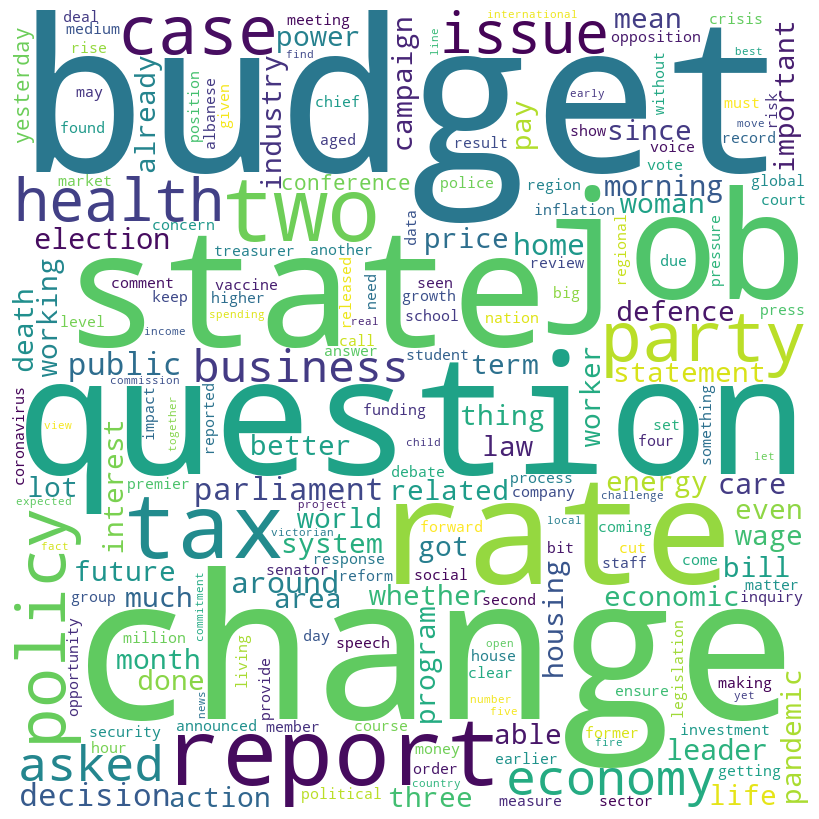

In [70]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

count_scores = count_df.sum(axis=0)

count_dict = count_scores.to_dict()

wordcloud = WordCloud(width=800, height=800,
                      background_color='white',
                      min_font_size=10).generate_from_frequencies(count_dict)

plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

The word cloud was used to visualise the frequent terms that appear in the imported unstructured data. As mentioned previously, the term count topic modelling approach yielded the most significant results; therefore, the ‘count_df’ was used for this visualisation. The word cloud provides a visual representation of the most frequent words in Australian media articles surrounding the issue of funding for Indigenous Australians to help increase employment, boost the economy, and generate innovation.

Since the largest words include ‘question’, ‘change’, ‘budget’, ‘job’ and ‘state’. It can be concluded that the Australian media is questioning the state governments to change their budget to provide additional support in finding jobs for their Indigenous population.

It is important to note that word cloud visualisations often present simplistic and subjective representations of textual data. Therefore, it is crucial to refrain from drawing definitive conclusions based solely on the visualisation. However, since the purpose of the visualisation was to verify that this was an apparent issue, that the community is aware of, and the media commonly discusses this world cloud has affectively achieved its purpose, but, should not be made to draw any further conclusions without additional analysis.

##### Top Phrases

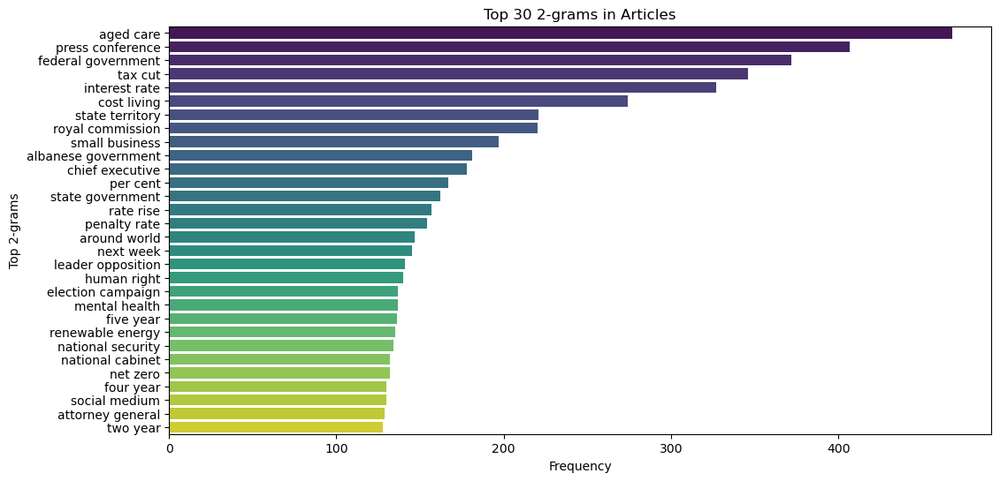

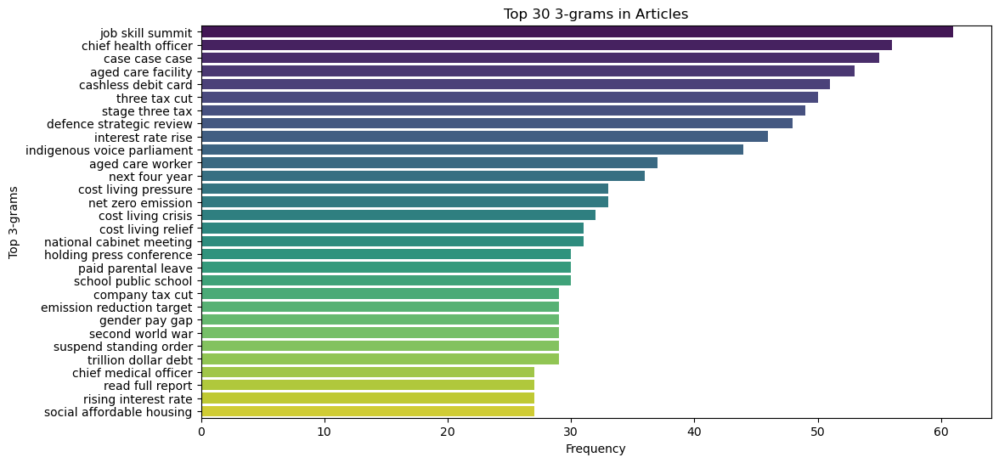

In [71]:
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns

def plot_top_ngrams(corpus, n=2, top_k=30):
    count_vectorizer = CountVectorizer(ngram_range=(n, n))

    ngram_matrix = count_vectorizer.fit_transform(corpus)

    ngram_counts = ngram_matrix.sum(axis=0).A1
    ngram_vocab = count_vectorizer.get_feature_names_out()

    ngram_freq = dict(zip(ngram_vocab, ngram_counts))

    top_ngrams = Counter(ngram_freq).most_common(top_k)

    ngrams, counts = zip(*top_ngrams)

    plt.figure(figsize=(12, 6))
    sns.barplot(x=list(counts), y=list(ngrams), palette='viridis')
    plt.xlabel('Frequency')
    plt.ylabel(f'Top {n}-grams')
    plt.title(f'Top {top_k} {n}-grams in Articles')
    plt.show()

corpus = list(preprocessed_articles.values())

plot_top_ngrams(corpus, n=2, top_k=30)

plot_top_ngrams(corpus, n=3, top_k=30)

The output of the graphs provided valuable insights into why improved distribution is required. Common themes in the plots include cost of living issues and rate rises, highlighting why it is important to analyse the Advance Queensland program to determine how they can better achieve their goal of fostering economic development and innovation to help grow the economy and create jobs. Additionally, while not substantial, some themes were produced that could be used when determining how the distributions of funds can be readjusted. These include 'small business', 'job skill summit', and 'indigenous voice parliament'. However, since this visualisation lacks proper context, these suggestions should be paired with further detailed analysis and context.

#### Indigenous Funding Breakdown
##### Pie Chart: Indigenous vs Non-Indigenous Funding

In [72]:
fig8 = px.pie(funding_df, values='Actual Contractual Commitment ($)', 
              names='Indigenous', 
              title='Indigenous vs Non-Indigenous Funding')
fig8.show()

The pie chart was used to visualise how funds have been distributed between Indigenous and non-Indigenous recipients. The graph highlights that, from an initial look, non-Indigenous focused programs received a significantly larger portion of the funding from the Advance Queensland program (97.9%). However, to provide detailed insights based on the chosen questions, more visualisations will need to be graphed, especially those showing the trends in funding over time. Without further information, the analysis would be incomplete and would lead to assumptions being made.

##### Bar Chart: Indigenous vs Non-Indigenous Funding Amount Over Time

In [73]:
fig9 = px.bar(funding_df, x="Year", 
              y="Actual Contractual Commitment ($)", 
              color="Indigenous", 
              title='Indigenous vs Non-Indigenous Funding Amount Over Time', 
              barmode='stack')
fig9.show()

At first glance, the visualisation appears to show an extremely small proportion of Indigenous focused programs. However, to ensure a nuanced analysis, many other factors need to be considered. These include population spread (as of 2021, 4.6% of the Queensland population was Indigenous*), level of need, monetary value required, and the percentage of non-Indigenous-focused programs that benefit Indigenous individuals or communities.

*As per, https://www.abs.gov.au/articles/queensland-aboriginal-and-torres-strait-islander-population-summary

##### Scatter Plot: Indigenous vs Non-Indigenous Funding Amount Over Time

In [74]:
fig10 = px.scatter(funding_df, x="Approval date", 
                  y="Actual Contractual Commitment ($)", 
                  color="Indigenous",  
                  title='Indigenous vs Non-Indigenous Funding Amount Over Time')
fig10.show()

The scatter plot reveals that all the high outliers are non-Indigenous programs, suggesting that Indigenous programs may not receive the same funding levels. The majority of the visible dots, which are red, support the analysis from the previous graph, indicating that Indigenous focused programs receive a small proportion of the funding. However, as previously mentioned, it is crucial to note that a nuanced analysis requires consideration of many other factors.

##### Pie Charts: Indigenous vs Non-Indigenous Funding by RAP Region

In [75]:
fig11 = px.pie(indigenous_yes_df, values='Actual Contractual Commitment ($)', 
              names='RAP Region', 
              title='Indigenous Funding by RAP Region')
fig11.show()

In [76]:
fig12 = px.pie(indigenous_no_df, values='Actual Contractual Commitment ($)', 
              names='RAP Region', 
              title='Non-Indigenous Funding by RAP Region')
fig12.show()

The graphs highlight that Brisbane and Redlands received the most funding by a significant amount for both groups. Other than that, the two graphs showed differing results. For non-Indigenous funding, the top three RAP Regions are all located in South-East Queensland and are metropolitan areas. However, for Indigenous funding, the RAP Regions are spread around the state.

When compared to Census data, it initially appears that the Indigenous funding could be better distributed as Moreton Bay has no funding despite having the second-highest Indigenous population in the state*. However, additional factors must be considered for this scenario and others if they arrive. For instance, the population does not equate to the need for funding, and secondly, Moreton Bay is located within close proximity to Brisbane and Redlands, a potential reason for the lack of funding. Without considering external factors, analysing and making decisions based solely on the provided data prevents a nuanced analysis from occurring and increases the risk of bias, misinterpretation and unbalanced insights.

*As per, https://www.abs.gov.au/articles/queensland-aboriginal-and-torres-strait-islander-population-summary

##### Scatter Plots: Funding Distribution by Indigenous Status and Region

In [77]:
fig13 = px.scatter_3d(funding_df, x='Indigenous_n', 
                     y='Region_n', 
                     z='Funding_n',
                     color='km4',
                     title='Funding Distribution by Indigenous Status and Region - 4 Clusters')
fig13.show()

In [78]:
fig14 = px.scatter_3d(funding_df, x='Indigenous_n', 
                     y='Region_n', 
                     z='Funding_n',
                     color='km6',
                     title='Funding Distribution by Indigenous Status and Region - 6 Clusters')
fig14.show()

The first scatter plot was used to visualise the funding distribution between Indigenous and non-Indigenous focused programs in South-East Queensland and Regional Queensland. The four clusters each identify a different combination of the ‘Indigenous’ and ‘Region’ columns. When paired with funding as a third dimension, it can be observed that Indigenous programs receive less funding. However, the difference between the two regions is minimal.

When analysing the second scatter plot, with six clusters, additional information can be discovered. The same segment, non-Indigenous programs in South-East Queensland, represents the two additional clusters. It highlights that the large funding proportion for that segment is not solely from more programs being funded. The largest cluster for this segment lies in the middle of the scatter plot, higher than all other clusters associated with different segments. However, there is also a proportion of smaller funding amounts within this segment, similar to other segments. Additionally, an outlier cluster at the top represents extreme values. These outliers likely skew the descriptive statistics, making it appear that, on average, the funding received by this segment is higher than other segments. As that segment has a significantly higher funding proportion, the skewed data is not an extreme concern. However, it should be considered when providing insights and making decisions about the future distribution of funds.

##### Scatter Matrix: Relationships between Funding, Approval Date, Region, and Indigenous Status

In [79]:
fig15 = px.scatter_matrix(funding_df[["Actual Contractual Commitment ($)", 
                                     "Approval date", 
                                     "Region", 
                                     "Indigenous"]], 
                         title='Relationships between Funding, Approval Date, Region, and Indigenous Status', 
                         height=1200,
                         width= 1100)

fig15.update_layout(font=dict(size=10)) 

fig15.show()

Based on the scatter matrix, these are some notable insights that have not been previously identified:
- There were no outliers after 2020, highlighting that funding contributions lowered in value after COVID-19.
- South-East Queensland has more outliers in funding contributions than Regional Queensland.
- South-East Queensland receives more consistent funding than Regional Queensland.
- Non-Indigenous focused programs receive more consistent funding than Indigenous programs.
- Non-Indigenous focused programs have more outiers in funding contributions than Indigenous programs.

### Insights 
The above analysis of the Advance Queensland program funds reveals several key insights into the distribution patterns between Indigenous and non-Indigenous recipients.

Firstly, Indigenous recipients are consistently receiving less funding than their non-Indigenous counterparts. Whilst this is expected due to accounting for only 4.6%* of the Queensland population, the percentage of received funding is less than half (2.12%). Typically, this difference would not be a concern and could be explained by contextual factors; however, the Indigenous population has a very low employment rate of 52%**. Supporting the Indigenous population through programs like the Advance Queensland program is essential in providing them with the same opportunities other Queenslanders have.

Regardless of the portion of funding received, the actual funding received by Indigenous vs non-Indigenous recipients is alarming. The total funding commitment is 4,516.11% higher for non-Indigenous programs despite only having 3,321.05% more programs. Additionally, Indigenous programs have a lower mean and maximum value, \\$122,688.95 vs. \\$165,547.11 and \\$995,129.00 vs. $10,000,000.00, respectively. Whilst this could be attributed to the disparity in funding proportions, it also highlights that Indigenous recipients are not receiving the same level of funding as non-Indigenous recipients. 

The analysis of unstructured data from the Guardian API confirmed that this is an apparent issue that a) the Australian media is discussing and b) society is aware of. The data analysis reveals many themes regarding cost-of-living issues and rate rises, highlighting the prevalent need to support all communities in Queensland during the current economic state.

It is acknowledged that funding does not always correspond to population distribution; however, it can be observed that some substantial Indigenous communities are being neglected. Distribution of funds by region shows that Brisbane and Redlands are receiving the most funding for Indigenous and non-Indigenous programs, which is aligned with the fact that 9.7%* of the state's Indigenous population resides in that area. However, other regions like Moreton Bay, Cairns and Ipswich have yet to receive any Indigenous focused funding despite having 7.8%, 6.8% and 5.3% of the states Indigenous population, respectively. It is recognised that these regions are receiving funding that is non-indigenous focused; however, for minority communities, like Aboriginal peoples and Torres Strait Islanders, programs that are specifically focused towards their community, cultures and traditions are more perceptive and have a higher effective rate.

While the funding trends revealed that non-indigenous programs have consistently received high funding levels, they showed favourable fluctuations to the Indigenous. Funding for both groups increased significantly in 2020, coinciding with the start of the COVID-19 pandemic. It was identified that post-2020 Indigenous funding has remained at their 2018 and 2019 levels. However, non-Indigenous funding had decreased to its lowest ever. This highlights that the Advance Queensland program strategically changed its approach to funding distribution to help mitigate the negative effects of the COVID-19 pandemic for its citizens. Additionally, the reason why Indigenous funding is not decreasing at the same rate as non-Indigenous could be due to the Advance Queensland program identifying that Indigenous communities need additional support to recover compared to their non-Indigenous counterparts.

To summarise, additional support is required for the Indigenous communities within Queensland. The analysis highlighted a significant imbalance in funding distribution between Indigenous and non-Indigenous recipients. This disparity suggests that Indigenous programs are underfunded relative to non-Indigenous programs, which could undermine the program's goal of fostering economic development and innovation. Whilst additional analysis will need to be completed to determine the validity, some proposed suggestions are to increase funding to Indigenous programs, redistribute Indigenous funding to regional areas, and engage with Indigenous communities to see what specific programs will be the most beneficial. 

*As per, https://www.abs.gov.au/articles/queensland-aboriginal-and-torres-strait-islander-population-summary

** As per, https://www.indigenoushpf.gov.au/measures/2-07-employment 

#### Significance
These insights are significant as they highlight the disparities and inconsistencies in the funding distribution of the Advance Queensland program, directly addressing the main question and sub-questions. The underfunding of Indigenous programs relative to non-Indigenous ones implies that the program may not be effectively supporting economic development and innovation within Indigenous communities.

The analysis of media coverage indicates that the imbalance in funding is a point of concern and discussion in Australian media, highlighting societal awareness and the importance of addressing this issue. The insights provide a nuanced understanding of the funding distribution by considering factors such as population size, economic activity, infrastructure development, and innovation potential. However, it is still highlighted that the distribution of funding for Indigenous programs is misaligned and should be redistributed with more consideration of population size. When identifying trends in the distribution of funds, a notable increase in 2020 was highlighted, likely a response to the COVID-19 pandemic to support the Queensland economy during a period of economic downturn. This offered key insights into the program's funding patterns and strategic decision-making. 

Overall, the provided insights help understand the funding allocation of the Advance Queensland program and how it can improve to better contribute to economic growth, innovation, and job creation across Queensland.

#### Ethical Considerations
Ethical considerations were acknowledged and addressed throughout this data analytics cycle to ensure a fair, balanced and transparent analysis. For convenience, some of the ethical considerations are explained below.

The unstructured data introduced many potential ethical complications; however, these were all addressed as best as possible with the current resources. Firstly, it was acknowledged that not all media articles are unbiased, and negative stereotypes, particularly towards Indigenous populations, are apparent and may impact the analysis. However, to reduce this impact, 110 articles were used to ensure various authors' voices were considered. Additionally, three different topic modelling approaches were used to check that no unfounded conclusions or misinterpreted data were present in the chosen technique. Finally, it was also acknowledged that the pre-processing steps of the unstructured data could have added bias or removed context from the analysis. Whilst careful steps were taken to not, it cannot be guaranteed, and thus must be considered when developing insights to have a nuanced response.  

It was also acknowledged that population size and funding are not direct indicators of another; external factors need to be considered without automatically assuming region favouritism. 

A list was required to filter the DataFrame into Indigenous and non-Indigenous recipients. This list consisted of words commonly used to address or discuss Indigenous Australians. However, it was acknowledged that some of the listed words may be used in a different context and thus potentially misrepresent the data. Therefore, the DataFrame was filtered to only Indigenous recipients and manually checked. However, due to the lack of information on the Queensland Government Open Data Portal, some programs may have been incorrectly identified as non-Indigenous. However, this has been acknowledged and considered during the data analytics cycle.

It was also acknowledged that using random samples to verify the data potentially added technical bias to the analysis. Sometimes, random number generation is not always random. Therefore, when random samples were required, it was ensured that there was more than one so a better understanding of the data could be achieved, minimising the potential effects of technical bias.

Finally, it was also identified that the provided data was as of the first quarter of March. This was acknowledged to ensure that insights were not derived, assuming it was a full year's worth of data.
 
#### Shortcomings 
The provided insights regarding the Advance Queensland program funds distribution between Indigenous and non-Indigenous recipients had a few notable shortcomings. Firstly, due to the limited data provided on the Queensland Government Open Data Portal, contextual information about the Advance Queensland program could not be accessed. For instance, contextual information regarding the outcomes of each project is not accessible, which unfortunately prevents the true impact of the funding from being assessed. Thus, the ability of the Advance Queensland program to achieve its specified goals can not be accurately analysed. Additionally, the dataset does not indicate what recipients are Indigenous. The identification of Indigenous focused programs relied solely on using keywords; however, it could not be guaranteed that all applicable programs were identified, potentially leading to underreporting. Moreover, no information was used to compare how the distribution of funds was affected by economic factors, such as Gross Domestic Profit, unemployment rate, inflation, interest, and exchange rates. These factors are essential in determining how well the Advance Queensland program works.

#### Areas of Improvement
The completed data analytics cycle can be improved through a plethora of measures. Whilst outside of the scope of this assessment, comparative analysis could be used in combination with other data sources to determine if regions are receiving proportionate funding in terms of their needs and population size. The use of additional data sources would provide valuable insights and can help provide contextual information. For instance, instead of referring to the Census data regarding the population of Indigenous Australians in Queensland, uploading the data would provide much more valuable insights. Another area of improvement would be fixing the bug that prevented the stop words in the 'additional_stop_words' list from being correctly filtered out. This would provide a much better analysis of the unstructured data and lead to more valuable insights than what has been presented in this data analytics cycle.